In [1]:
import sys
sys.path.append('C:\\projects\\UTNCE\\src\\utnce202402')

In [2]:
from simplify import *
from prepare import *
from routing import *
from percolation_plot import *
from generate import *
from transfer import *
from copy import deepcopy
from shapely.geometry import Point,LineString
from pyproj import Proj, Transformer
import pickle
import itertools
from itertools import combinations
import random
from sympy import symbols, Eq, solve
# import datetime
import contextily as ctx

In [3]:
osm_path = "C:\\projects\\UTNCE\\data\\Amsterdam.large.pbf"

# Subway-Amsterdam 

## Generate Baseline network

In [4]:
# Obtain sub-stations in the city
city_sub_stations = sub_stations(osm_path)

In [5]:
# Obtain subway network data
city_sub_network = subway_network(osm_path)

# Prepare the network edges and nodes based on sub-stations and subway network
edges, nodes = prepare_network(city_sub_network, city_sub_stations)

# Expand the edges if required
edges = expand_edges(edges)

# Obtain sub-routes in the city
city_sub_routes = sub_routes(osm_path)

# Sort the sub-routes
city_sub_routes = sorted_routes(city_sub_routes)

# Check the name and assign a column
check_name = check_to_column(city_sub_routes, city_sub_stations)

topology: 100%|████████████████████████████████████████████████████████████████████| 962/962 [00:00<00:00, 3466.69it/s]


In [6]:
# Calculate dataframe length of nodes and edges of metro for adding it to tram dataframes
id_edges_length_sub = len(edges)
id_nodes_length_sub = len(nodes)

In [7]:
# id_nodes_length_sub

In [8]:
# id_edges_length_sub

In [9]:
# create copy dataframe for nodes and edges
city_sub_edges = pd.DataFrame(edges.copy())
city_sub_nodes = pd.DataFrame(nodes.copy())

In [10]:
# delete useless and wrong edges 
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 771) & (city_sub_edges['to_id'] == 761)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 771) & (city_sub_edges['to_id'] == 766)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 762) & (city_sub_edges['to_id'] == 771)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 767) & (city_sub_edges['to_id'] == 771)].index, inplace=True)

city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 780) & (city_sub_edges['to_id'] == 773)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 780) & (city_sub_edges['to_id'] == 772)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 774) & (city_sub_edges['to_id'] == 780)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 775) & (city_sub_edges['to_id'] == 780)].index, inplace=True)

city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 180) & (city_sub_edges['to_id'] == 345)].index, inplace=True)

city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 491) & (city_sub_edges['to_id'] == 492)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 498) & (city_sub_edges['to_id'] == 499)].index, inplace=True)



city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 634) & (city_sub_edges['to_id'] == 635)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 654) & (city_sub_edges['to_id'] == 655)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 584) & (city_sub_edges['to_id'] == 585)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 569) & (city_sub_edges['to_id'] == 570)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 588) & (city_sub_edges['to_id'] == 589)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 577) & (city_sub_edges['to_id'] == 589)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 607) & (city_sub_edges['to_id'] == 577)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 564) & (city_sub_edges['to_id'] == 565)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 586) & (city_sub_edges['to_id'] == 587)].index, inplace=True)

city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 643) & (city_sub_edges['to_id'] == 644)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 638) & (city_sub_edges['to_id'] == 639)].index, inplace=True)

city_sub_edges = city_sub_edges.reset_index(drop = True)

In [11]:
# revise Zuid metro stations' coordinates, replace 712 with 180 and 345 nodes to avoid wrong shortest-path edges
geometry_value1 = city_sub_nodes.loc[city_sub_nodes['id'] == 180, 'geometry'].values[0]
geometry_value2 = city_sub_nodes.loc[city_sub_nodes['id'] == 345, 'geometry'].values[0]

city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737797', 'geometry'] = geometry_value1
city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737797', 'geo_x'] = geometry_value1.x
city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737797', 'geo_y'] = geometry_value1.y

city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737796', 'geometry'] = geometry_value2
city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737796', 'geo_x'] = geometry_value2.x
city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737796', 'geo_y'] = geometry_value2.y

In [12]:
# city_sub_nodes

In [13]:
# city_sub_stations

In [14]:
# city_sub_edges

In [15]:
# city_sub_routes

In [16]:
# Define replacement dictionary of names of destination stations
replacement_dict = {
     'Amsterdam Centraal': 'Centraal Station',
}
# Replace values in the 'to' column of the metro routes using the replacement dictionary
city_sub_routes['to'] = city_sub_routes['to'].replace(replacement_dict, regex=True).str.strip()

# Reset the index of the metro routes
city_sub_routes = city_sub_routes.reset_index(drop=True)

# Check if the values in the 'to' column of the metro routes match the station names
check_name = check_to_column(city_sub_routes, city_sub_stations)

In [17]:
# # restore DataFrames as pickle files
# city_sub_edges.to_pickle('city_sub_edges_0328.pkl')
# city_sub_stations.to_pickle('city_sub_stations_0328.pkl')
# city_sub_nodes.to_pickle('city_sub_nodes_0328.pkl')
# city_sub_routes.to_pickle('city_sub_routes_0328.pkl')

In [18]:
# Create a dictionary mapping start stations to their corresponding routes
city_sub_start_station_name_dict = start_station_dict(city_sub_routes)

# Create a dictionary mapping subway lines to their corresponding routes
city_sub_line_dict = line_dict(city_sub_routes)

# Create a list of all station names in the city's subway network
city_all_sub_stations_name = all_station_list(city_sub_stations)

# Create a dictionary mapping subway lines to the ordered list of stations on each line
city_sub_order_route_dict = order_stations_inline(city_sub_line_dict, city_all_sub_stations_name, city_sub_routes, city_sub_start_station_name_dict)

In [19]:
# city_sub_order_route_dict

In [20]:
# revise station sequence of 51_1 route
df51_1 = pd.read_excel('C:\\projects\\UTNCE\\data\\Metro 51 Centraal Station = Isolatorweg.xlsx',header=None)
df51_1 = df51_1[0::4].reset_index(drop=True)
df51_1.columns = ['name']
df51_1.name[9] = 'Zuid' 
df51_1.name[13] = 'Lelylaan' 
df51_1.name[16] = 'De Vlugtlaan' 

df = city_sub_order_route_dict['Metro 51: Centraal Station => Isolatorweg']
df_reordered = pd.merge(df51_1,df,on='name')

desired_order = ['id', 'name', 'geometry', 'geo_x', 'geo_y']
df_reordered = df_reordered[desired_order]

key_to_replace = 'Metro 51: Centraal Station => Isolatorweg'
city_sub_order_route_dict[key_to_replace] = df_reordered

# city_sub_order_route_dict

In [21]:
# revise station sequence of 52 routes
df52_metro_1 = city_sub_order_route_dict['Metro 52: Noord => Zuid']
df52_metro_2 = city_sub_order_route_dict['Metro 52: Zuid => Noord']

df52_metro_1_dep = df52_metro_1[df52_metro_1.name == 'De Pijp'].copy()
df52_metro_2_dep = df52_metro_2[df52_metro_2.name == 'De Pijp'].copy()


columns_to_swap = ['geometry', 'geo_x', 'geo_y']
for column in columns_to_swap:
    temp = df52_metro_1_dep[column].copy()
    df52_metro_1_dep.loc[df52_metro_1_dep['name'] == 'De Pijp', column] = df52_metro_2_dep.loc[df52_metro_2_dep['name'] == 'De Pijp', column].values
    df52_metro_2_dep.loc[df52_metro_2_dep['name'] == 'De Pijp', column] = temp.values

df52_metro_1.loc[df52_metro_1['name'] == 'De Pijp', columns_to_swap] = df52_metro_1_dep[columns_to_swap].values
df52_metro_2.loc[df52_metro_2['name'] == 'De Pijp', columns_to_swap] = df52_metro_2_dep[columns_to_swap].values

# city_sub_order_route_dict

In [22]:
# city_sub_order_route_dict

In [23]:
# Create a dictionary mapping subway lines to the pairs of station IDs on each line
city_sub_order_id_pairs = id_pairs_inline(city_sub_line_dict, city_sub_order_route_dict, city_sub_nodes)

In [24]:
# Create a graph representing the subway network using the extracted undirected edges and nodes
G = create_ground_graph(city_sub_edges, city_sub_nodes)

# Calculate the shortest path id pairs for each subway line

city_sub_all_shortest_paths_id_dict = city_sub_order_id_pairs.copy()


for line in city_sub_order_id_pairs.keys():
    # Calculate all shortest paths id for the current line using the subway network edges
    city_sub_all_shortest_paths_id_dict[line] = all_shortest_path_id_list(G, city_sub_order_id_pairs[line], city_sub_edges)

In [25]:
# city_sub_all_shortest_paths_id_dict

In [26]:
# city_sub_edges

In [27]:
# Obtain the right ordered edges dataframe of metro
city_sub_ordered_edges = edges_revise_direction(city_sub_all_shortest_paths_id_dict,city_sub_edges)

In [28]:
# city_sub_ordered_edges

In [29]:
# Create a graph representing the subway network using the directed edges and nodes
G = nx.DiGraph()

for _, row in city_sub_nodes.iterrows():
    node = row['id']  # Assuming 'id' is the node identifier
    geometry = row['geometry']
    x, y = geometry.x, geometry.y
    G.add_node(node, pos=(x, y))
    
# Extract the edges from the input DataFrame and create a list of tuples with time
od = city_sub_ordered_edges[['from_id', 'to_id', 'time', 'weights']]
edges_list = []
for i, row in od.iterrows():
    weight_dict = {"weight": row[2]*60}
    tuple_row = (row[0], row[1], weight_dict)
    edges_list.append(tuple_row)
# edges_list
G.add_edges_from(edges_list)

In [30]:
# Calculate the shortest path pairs for each subway line
city_sub_shortest_path_pairs_dict = city_sub_order_id_pairs.copy()
duplicate_row_count = city_sub_order_id_pairs.copy()
city_sub_shortest_path_edges_dict = city_sub_order_id_pairs.copy()
city_sub_edges_dict = city_sub_order_id_pairs.copy()

for line in city_sub_order_id_pairs.keys():
    # Calculate all shortest paths for the current line using the subway network edges
    city_sub_shortest_path_pairs_dict[line] = all_shortest_paths(G, city_sub_order_id_pairs[line], city_sub_ordered_edges)

    # Count the duplicate rows, calculate the weighted edges for shortest paths,
    # and update the subway network edges for the current line
    duplicate_row_count[line], city_sub_shortest_path_edges_dict[line], city_sub_edges_dict[line] = edges_with_count_weight(city_sub_shortest_path_pairs_dict[line], city_sub_ordered_edges)
    
# Plot all subway routes
# plot_routes(city_sub_routes, city_sub_ordered_edges, city_sub_shortest_path_edges_dict)

In [31]:
# city_sub_shortest_path_pairs_dict

## Obtain dataframes of edges,nodes and stations for baseline network of metro

### Add columns to edges--city_sub_extended_edges

In [32]:
city_sub_shortest_path_edges = add_ref_to_orderroutes_or_shortestpath_dict(city_sub_shortest_path_edges_dict, city_sub_routes)

In [33]:
city_sub_extended_edges = add_columns_to_edges(city_sub_shortest_path_edges_dict,city_sub_ordered_edges)

In [34]:
# column_to_drop = 'count_weight'
# city_sub_extended_edges = city_sub_extended_edges.drop(columns=column_to_drop)

In [35]:
city_sub_extended_edges

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,weights,to_from,from_to,count_weight,route_name_list,route,ref
0,23157994,"LINESTRING (4.9236699 52.3361909, 4.9236979 52...",subway,None,0,1,0,258.660599,0.010346,258,"(0, 1)","(1, 0)",1.0,Metro 51: Isolatorweg => Centraal Station,subway,51
1,23158053,"LINESTRING (4.9642294 52.2945339, 4.9644259 52...",subway,None,1,2,3,215.433271,0.008617,215,"(3, 2)","(2, 3)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 54"
2,23158054,"LINESTRING (4.9622901 52.2955678, 4.9624673 52...",subway,None,2,4,5,121.794737,0.004872,121,"(5, 4)","(4, 5)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 54"
3,23189033,"LINESTRING (4.8467318 52.3952137, 4.8471439 52...",subway,None,3,7,6,28.046592,0.001122,28,"(6, 7)","(7, 6)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
4,23189039,"LINESTRING (4.8409161 52.3937679, 4.8416087 52...",subway,None,4,492,8,382.935219,0.015317,382,"(8, 492)","(492, 8)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
935,1131538381,"LINESTRING (4.9200955 52.3417374, 4.9200444 52...",subway,None,957,803,463,73.656989,0.002946,73,"(463, 803)","(803, 463)",1.0,Metro 53: Gaasperplas => Centraal Station,subway,"53, 54"
936,1131538382,"LINESTRING (4.9201445 52.3416568, 4.9200955 52...",subway,None,958,462,803,9.568427,0.000383,9,"(803, 462)","(462, 803)",1.0,Metro 53: Gaasperplas => Centraal Station,subway,"53, 54"
937,1131538383,"LINESTRING (4.9200365 52.3417239, 4.9200773 52...",subway,None,959,246,804,9.568874,0.000383,9,"(804, 246)","(246, 804)",1.0,Metro 51: Isolatorweg => Centraal Station,subway,51
938,1131538384,"LINESTRING (4.9197172 52.3423576, 4.9197589 52...",subway,None,960,804,463,73.789113,0.002952,73,"(463, 804)","(804, 463)",1.0,Metro 51: Isolatorweg => Centraal Station,subway,51


### Organize edges dataframe for baseline network--city_sub_new_edges

In [36]:
city_sub_shortest_path_edges_df = pd.concat(city_sub_shortest_path_edges_dict.values()).reset_index(drop=True)
city_sub_shortest_path_edges_df.drop_duplicates(subset='geometry',inplace=True,ignore_index=True)

In [37]:
# city_sub_shortest_path_edges_df

In [38]:
city_sub_new_edges = pd.merge(city_sub_extended_edges,city_sub_shortest_path_edges_df.geometry,on='geometry',how='inner')

In [39]:
city_sub_new_edges

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,weights,to_from,from_to,count_weight,route_name_list,route,ref
0,23157994,"LINESTRING (4.9236699 52.3361909, 4.9236979 52...",subway,None,0,1,0,258.660599,0.010346,258,"(0, 1)","(1, 0)",1.0,Metro 51: Isolatorweg => Centraal Station,subway,51
1,23158053,"LINESTRING (4.9642294 52.2945339, 4.9644259 52...",subway,None,1,2,3,215.433271,0.008617,215,"(3, 2)","(2, 3)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 54"
2,23158054,"LINESTRING (4.9622901 52.2955678, 4.9624673 52...",subway,None,2,4,5,121.794737,0.004872,121,"(5, 4)","(4, 5)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 54"
3,23189033,"LINESTRING (4.8467318 52.3952137, 4.8471439 52...",subway,None,3,7,6,28.046592,0.001122,28,"(6, 7)","(7, 6)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
4,23189039,"LINESTRING (4.8409161 52.3937679, 4.8416087 52...",subway,None,4,492,8,382.935219,0.015317,382,"(8, 492)","(492, 8)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631,1131538381,"LINESTRING (4.9200955 52.3417374, 4.9200444 52...",subway,None,957,803,463,73.656989,0.002946,73,"(463, 803)","(803, 463)",1.0,Metro 53: Gaasperplas => Centraal Station,subway,"53, 54"
632,1131538382,"LINESTRING (4.9201445 52.3416568, 4.9200955 52...",subway,None,958,462,803,9.568427,0.000383,9,"(803, 462)","(462, 803)",1.0,Metro 53: Gaasperplas => Centraal Station,subway,"53, 54"
633,1131538383,"LINESTRING (4.9200365 52.3417239, 4.9200773 52...",subway,None,959,246,804,9.568874,0.000383,9,"(804, 246)","(246, 804)",1.0,Metro 51: Isolatorweg => Centraal Station,subway,51
634,1131538384,"LINESTRING (4.9197172 52.3423576, 4.9197589 52...",subway,None,960,804,463,73.789113,0.002952,73,"(463, 804)","(804, 463)",1.0,Metro 51: Isolatorweg => Centraal Station,subway,51


### Organize nodes dataframe for baseline network--city_sub_new_nodes

In [40]:
city_sub_shortest_path_nodes_id = pd.DataFrame(list(city_sub_new_edges['from_id'])+list(city_sub_new_edges['to_id'])).drop_duplicates(ignore_index = True)

In [41]:
city_sub_shortest_path_nodes_id = city_sub_shortest_path_nodes_id.rename(columns={0:'id'})

In [42]:
# city_sub_shortest_path_nodes_id

In [43]:
city_sub_new_nodes = pd.merge(city_sub_shortest_path_nodes_id,city_sub_nodes,on='id',how='left').reset_index(drop=True)

In [44]:
city_sub_new_nodes

,id,geometry,degree
0,1,POINT (4.9232197 52.3339159),2
1,2,POINT (4.9642294 52.2945339),2
2,4,POINT (4.9622901 52.2955678),2
3,7,POINT (4.8471439 52.3952143),2
4,492,POINT (4.8457805 52.395217),3
...,...,...,...
633,805,POINT (4.8505958 52.3951031),2
634,323,POINT (4.989299 52.2962711),2
635,180,POINT (4.8772326 52.3393181),3
636,728,POINT (4.9010471 52.3775081),2


### Add columns to stations--city_sub_new_staions

In [45]:
city_sub_order_route_dict = add_ref_to_orderroutes_or_shortestpath_dict(city_sub_order_route_dict, city_sub_routes)

In [46]:
city_sub_new_stations = add_columns_to_nodes(city_sub_order_route_dict, city_sub_new_nodes)

In [47]:
city_sub_new_stations

,id,geometry,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
0,328,POINT (4.98916 52.29641),2,Gein,4.989161,52.296407,"(4.9891612, 52.2964067)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
1,855,POINT (4.97400 52.29564),2,Reigersbos,4.974000,52.295637,"(4.9740002, 52.2956365)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
2,854,POINT (4.96013 52.29813),2,Holendrecht,4.960126,52.298132,"(4.9601264, 52.2981319)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
3,810,POINT (4.95213 52.30687),2,Bullewijk,4.952129,52.306869,"(4.9521292, 52.306869)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
4,809,POINT (4.94762 52.31181),2,Bijlmer ArenA,4.947618,52.311806,"(4.9476178, 52.311806)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
...,...,...,...,...,...,...,...,...,...,...,...
82,824,POINT (4.96734 52.32837),2,Verrijn Stuartweg,4.967335,52.328367,"(4.9673352, 52.3283668)",Metro 53: Gaasperplas => Centraal Station,subway,53,None
83,823,POINT (4.95669 52.33041),2,Station Diemen Zuid,4.956688,52.330406,"(4.9566878, 52.3304057)",Metro 53: Gaasperplas => Centraal Station,subway,53,None
84,829,POINT (4.94628 52.32683),2,Venserpolder,4.946277,52.326833,"(4.9462773, 52.3268326)",Metro 53: Gaasperplas => Centraal Station,subway,53,None
85,827,POINT (4.93028 52.32974),2,Van der Madeweg,4.930285,52.329735,"(4.9302846, 52.3297352)",Metro 53: Gaasperplas => Centraal Station,subway,"50, 53, 54","50, 53, 54"


# Tram-Amsterdam

## Generate Baseline Networks

In [48]:
city_tram_stations, edges, nodes, city_tram_routes = prepare_tram(osm_path)

topology: 100%|██████████████████████████████████████████████████████████████████| 2204/2204 [00:00<00:00, 3585.60it/s]


Calculate_degree possibly unhappy


In [49]:
# city_tram_stations

In [50]:
id_nodes_length_tram = len(nodes)
id_edges_length_tram = len(edges)

In [51]:
id_nodes_length_tram

1920

In [52]:
id_edges_length_tram 

2204

In [53]:
city_tram_edges = pd.DataFrame(edges.copy())
city_tram_nodes = pd.DataFrame(nodes.copy())

In [54]:
# city_tram_edges

In [55]:
# city_tram_nodes

In [56]:
# Add the number of nodes and edges of metro to tram, which help unify them into one layer netwrok
city_tram_nodes['id'] = city_tram_nodes['id'] + id_nodes_length_sub

id_new_edges_length_sub = city_sub_new_edges['id'].iloc[-1]
city_tram_edges['id'] = city_tram_edges['id'] + id_new_edges_length_sub+1
city_tram_edges['from_id'] = city_tram_edges['from_id'] + id_nodes_length_sub
city_tram_edges['to_id'] = city_tram_edges['to_id'] + id_nodes_length_sub
city_tram_edges['from_to'] = list(zip(city_tram_edges.from_id, city_tram_edges.to_id))
city_tram_edges['to_from'] = list(zip(city_tram_edges.to_id, city_tram_edges.from_id))

In [57]:
city_tram_edges

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,weights,to_from,from_to
0,7045610,"LINESTRING (4.9324018 52.3610615, 4.932387 52....",tram,None,962,868,869,28.561299,0.002040,28,"(869, 868)","(868, 869)"
1,7045616,"LINESTRING (4.934085 52.3609657, 4.9340765 52....",tram,None,963,870,871,146.082551,0.010434,146,"(871, 870)","(870, 871)"
2,7045675,"LINESTRING (4.9337809 52.3611734, 4.9339017 52...",tram,None,964,872,873,390.987463,0.027928,390,"(873, 872)","(872, 873)"
3,7045689,"LINESTRING (4.9394 52.361617, 4.9385742 52.361...",tram,None,965,874,875,345.247175,0.024661,345,"(875, 874)","(874, 875)"
4,7045994,"LINESTRING (4.9157261 52.365067, 4.9157046 52....",tram,None,966,876,2598,35.152166,0.002511,35,"(2598, 876)","(876, 2598)"
...,...,...,...,...,...,...,...,...,...,...,...,...
2199,1185084715,"LINESTRING (4.8520736 52.3479443, 4.8521852 52...",tram,None,3161,2364,1462,11.280287,0.000806,11,"(1462, 2364)","(2364, 1462)"
2200,1185084716,"LINESTRING (4.852325 52.3480075, 4.852489 52.3...",tram,None,3162,1430,1940,12.010525,0.000858,12,"(1940, 1430)","(1430, 1940)"
2201,1185084717,"LINESTRING (4.8516012 52.3470208, 4.8519064 52...",tram,None,3163,2365,1429,81.765515,0.005840,81,"(1429, 2365)","(2365, 1429)"
2202,1185084718,"LINESTRING (4.8522982 52.348033, 4.8524709 52....",tram,None,3164,1434,1947,12.587379,0.000899,12,"(1947, 1434)","(1434, 1947)"


In [58]:
# gpd.GeoDataFrame(city_tram_edges[['osm_id', 'id', 'geometry','from_id','to_id','distance','time','weights']]).to_file('city_tram_edges0502.GPKG',driver='GPKG')

In [59]:
# gpd.GeoDataFrame(city_tram_nodes[['geometry','degree','id']]).to_file('city_tram_nodes0505.GPKG',driver='GPKG')

In [60]:
# Delete useless and wrong edges
# tram 12
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2099) & (city_tram_edges['to_id'] == 2100)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1510) & (city_tram_edges['to_id'] == 1369)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2331) & (city_tram_edges['to_id'] == 1369)].index, inplace=True)

# tram 19
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2096) & (city_tram_edges['to_id'] == 1246)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1246) & (city_tram_edges['to_id'] == 2096)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1386) & (city_tram_edges['to_id'] == 1390)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1390) & (city_tram_edges['to_id'] == 1386)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[city_tram_edges['id'] == 1207].index, inplace=True)  

# tram 26-2
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2310) & (city_tram_edges['to_id'] == 1546)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1359) & (city_tram_edges['to_id'] == 2778)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2778) & (city_tram_edges['to_id'] == 1359)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[city_tram_edges['id'] == 1685].index, inplace=True)

# tram 4,14,24
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2150) & (city_tram_edges['to_id'] == 1201)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1806) & (city_tram_edges['to_id'] == 2150)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2777) & (city_tram_edges['to_id'] == 1544)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2776) & (city_tram_edges['to_id'] == 1659)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1641) & (city_tram_edges['to_id'] == 1576)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1640) & (city_tram_edges['to_id'] == 1641)].index, inplace=True)
city_tram_edges = city_tram_edges.reset_index(drop = True)

In [61]:
# city_tram_edges

In [62]:
# city_tram_nodes

In [63]:
# Revise destination name of routes dataframe in 'to' column
city_tram_routes = city_tram_routes.loc[city_tram_routes.ref != 'EMA']

city_tram_routes, check_name = check_tram_routes(city_tram_stations, city_tram_routes)

replacement_dict = {
    ',': '',
    'Diemen': '',
    'Amsterdam': '',
    'Sloterdijk': 'Station Sloterdijk',
    'Osdorp Dijkgraafsplein': 'Dijkgraafplein',
    'Osdorp De Aker': 'Matterhorn'
}

city_tram_stations, city_tram_routes, check_name = recheck_tram_routes(replacement_dict, city_tram_stations, city_tram_routes)


replacement_dict = {
    'Amstelveen Westwijk': 'Westwijk'
}

city_tram_stations, city_tram_routes, check_name = recheck_tram_routes(replacement_dict, city_tram_stations, city_tram_routes)

In [64]:
# city_tram_stations

In [65]:
# city_tram_routes

In [66]:
# Create a dictionary mapping start stations to their corresponding routes
city_tram_start_station_name_dict = start_station_dict(city_tram_routes)

# Create a dictionary mapping tram lines to their corresponding routes
city_tram_line_dict = line_dict(city_tram_routes)

# Create a list of all station names in the city's tram network
city_all_tram_stations_name = all_station_list(city_tram_stations)

# Create a dictionary mapping tram lines to the ordered list of stations on each line
city_tram_order_route_dict = order_stations_inline(city_tram_line_dict, city_all_tram_stations_name, city_tram_routes, city_tram_start_station_name_dict)

# Create a dictionary mapping tram lines to the pairs of station IDs on each line
city_tram_order_id_pairs = id_pairs_inline(city_tram_line_dict, city_tram_order_route_dict, city_tram_nodes)

# Create a graph representing the tram network using the extracted edges and nodes
G = create_ground_graph(city_tram_edges, city_tram_nodes)

# Calculate the shortest path pairs for each tram line
city_tram_all_shortest_paths_id_dict = city_tram_order_id_pairs.copy()


for line in city_tram_order_id_pairs.keys():
    
    city_tram_all_shortest_paths_id_dict[line] = all_shortest_path_id_list(G, city_tram_order_id_pairs[line], city_tram_edges)

In [67]:
# city_tram_order_id_pairs

In [68]:
# city_tram_all_shortest_paths_id_dict

In [69]:
# Obtain the right ordered edges dataframe of tram
city_tram_ordered_edges = edges_revise_direction(city_tram_all_shortest_paths_id_dict,city_tram_edges)

In [70]:
duplicated_rows = city_tram_ordered_edges[city_tram_ordered_edges.index.duplicated(keep=False)]

In [71]:
# duplicated_rows

In [72]:
len(duplicated_rows)

72

In [73]:
# Create a graph representing the tram network using the directed edges and nodes
G = nx.DiGraph()

for _, row in city_tram_nodes.iterrows():
    node = row['id']  # Assuming 'id' is the node identifier
    geometry = row['geometry']
    x, y = geometry.x, geometry.y
    G.add_node(node, pos=(x, y))
    
# Extract the edges from the input DataFrame and create a list of tuples with time
od = city_tram_ordered_edges[['from_id', 'to_id', 'time','weights']]
edges_list = []
for i, row in od.iterrows():
    weight_dict = {"weight": row[2]*60}
    tuple_row = (row[0], row[1], weight_dict)
    edges_list.append(tuple_row)
# edges_list

G.add_edges_from(edges_list)

In [74]:
# Calculate the shortest path pairs for each tram line
city_tram_shortest_path_pairs_dict = city_tram_order_id_pairs.copy()
duplicate_row_count = city_tram_order_id_pairs.copy()
city_tram_shortest_path_edges_dict = city_tram_order_id_pairs.copy()
city_tram_edges_dict = city_tram_order_id_pairs.copy()

for line in city_tram_order_id_pairs.keys():
    # Calculate all shortest paths for the current line using the tram network edges
    city_tram_shortest_path_pairs_dict[line] = all_shortest_paths(G, city_tram_order_id_pairs[line], city_tram_ordered_edges)

    # Count the duplicate rows, calculate the weighted edges for shortest paths,
    # and update the tram network edges for the current line
    duplicate_row_count[line], city_tram_shortest_path_edges_dict[line], city_tram_edges_dict[line] = edges_with_count_weight(city_tram_shortest_path_pairs_dict[line], city_tram_ordered_edges)
    
# # Plot all tram routes
# plot_routes(city_tram_routes, city_tram_ordered_edges, city_tram_shortest_path_edges_dict)

In [75]:
# df1_1 = city_tram_shortest_path_edges_dict['Tram 1: Amsterdam Muiderpoortstation =>Amsterdam Osdorp De Aker']
# df1_2 = city_tram_shortest_path_edges_dict['Tram 1: Amsterdam Osdorp de Aker => Amsterdam Muiderpoortstation']

# df12_1 = city_tram_shortest_path_edges_dict['Tram 12: Amsterdam Centraal Station => Amsterdam Amstelstation']
# df12_2 = city_tram_shortest_path_edges_dict['Tram 12: Amsterdam Amstelstation => Amsterdam Centraal Station']

# df13_1 = city_tram_shortest_path_edges_dict['Tram 13: Amsterdam Centraal Station => Amsterdam Geuzenveld']
# df13_2 = city_tram_shortest_path_edges_dict['Tram 13: Amsterdam Geuzenveld => Amsterdam Centraal Station']

# df14_1 = city_tram_shortest_path_edges_dict['Tram 14: Amsterdam Centraal Station => Amsterdam Flevopark']
# df14_2 = city_tram_shortest_path_edges_dict['Tram 14: Amsterdam Flevopark => Amsterdam Centraal Station']

# df17_1 = city_tram_shortest_path_edges_dict['Tram 17: Amsterdam Centraal Station => Amsterdam Osdorp Dijkgraafsplein']
# df17_2 = city_tram_shortest_path_edges_dict['Tram 17: Amsterdam Osdorp Dijkgraafsplein => Amsterdam Centraal Station']

# df19_1 = city_tram_shortest_path_edges_dict['Tram 19: Amsterdam Sloterdijk => Diemen Sniep']
# df19_2 = city_tram_shortest_path_edges_dict['Tram 19: Diemen Sniep => Amsterdam Sloterdijk']

# df2_1 = city_tram_shortest_path_edges_dict['Tram 2: Amsterdam Centraal Station => Amsterdam Nieuw Sloten']
# df2_2 = city_tram_shortest_path_edges_dict['Tram 2: Amsterdam Nieuw Sloten => Amsterdam Centraal Station']

# df24_1 = city_tram_shortest_path_edges_dict['Tram 24: Amsterdam Centraal Station => Amsterdam VUmc']
# df24_2 = city_tram_shortest_path_edges_dict['Tram 24: Amsterdam VUmc => Amsterdam Centraal Station']

# df25_1 = city_tram_shortest_path_edges_dict['Tram 25: Amstelveen Westwijk => Amsterdam Station Zuid']
# df25_2 = city_tram_shortest_path_edges_dict['Tram 25: Amsterdam Station Zuid => Amstelveen Westwijk']

# df26_1 = city_tram_shortest_path_edges_dict['Tram 26: Amsterdam IJburg => Amsterdam Centraal Station']
# df26_2 = city_tram_shortest_path_edges_dict['Tram 26: Amsterdam Centraal Station => Amsterdam IJburg']

# df3_1 = city_tram_shortest_path_edges_dict['Tram 3: Amsterdam Westergasfabriek => Amsterdam Flevopark']
# df3_2 = city_tram_shortest_path_edges_dict['Tram 3: Amsterdam Flevopark => Amsterdam Westergasfabriek']

# df4_1 = city_tram_shortest_path_edges_dict['Tram 4: Amsterdam Station RAI => Amsterdam Centraal Station']
# df4_2 = city_tram_shortest_path_edges_dict['Tram 4: Amsterdam Centraal Station => Amsterdam Station RAI']

# df5_1 = city_tram_shortest_path_edges_dict['Tram 5: Amstelveen Stadshart => Amsterdam Eerste Marnixdwarsstraat']
# df5_2 = city_tram_shortest_path_edges_dict['Tram 5: Amsterdam Eerste Marnixdwarsstraat => Amstelveen Stadshart']

# df7_1 = city_tram_shortest_path_edges_dict['Tram 7: Amsterdam Azartplein => Amsterdam Slotermeer']
# df7_2 = city_tram_shortest_path_edges_dict['Tram 7: Amsterdam Slotermeer => Amsterdam Azartplein']

In [76]:
# gpd.GeoDataFrame(df1_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df1_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df1_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df1_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df12_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df12_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df12_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df12_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df13_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df13_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df13_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df13_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df14_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df14_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df14_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df14_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df17_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df17_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df17_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df17_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df19_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df19_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df19_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df19_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df2_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df2_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df2_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df2_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df24_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df24_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df24_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df24_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df25_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df25_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df25_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df25_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df26_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df26_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df26_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df26_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df3_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df3_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df3_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df3_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df4_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df4_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df4_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df4_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df5_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df5_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df5_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df5_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df7_1[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df7_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df7_2[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('df7_2_0505.GPKG',driver='GPKG')

## Obtain dataframes of edges,nodes and stations for baseline network of Tram

### Add columns to edges--city_tram_extended_edges

In [77]:
city_tram_shortest_path_edges = add_ref_to_orderroutes_or_shortestpath_dict(city_tram_shortest_path_edges_dict, city_tram_routes)

In [78]:
city_tram_extended_edges = add_columns_to_edges(city_tram_shortest_path_edges_dict,city_tram_ordered_edges)

In [79]:
# column_to_drop = 'count_weight'
# city_tram_extended_edges = city_tram_extended_edges.drop(columns=column_to_drop)

In [80]:
# city_tram_extended_edges

### Organize edges dataframe for baseline network--city_tram_new_edges

In [81]:
city_tram_shortest_path_edges_df = pd.concat(city_tram_shortest_path_edges_dict.values()).reset_index(drop=True)
city_tram_shortest_path_edges_df.drop_duplicates(subset='geometry',inplace=True,ignore_index=True)

In [82]:
# city_tram_shortest_path_edges_df

In [83]:
city_tram_new_edges = pd.merge(city_tram_extended_edges,city_tram_shortest_path_edges_df.geometry,on='geometry',how='inner')

In [84]:
# city_tram_new_edges

In [85]:
# gpd.GeoDataFrame(city_tram_new_edges[['osm_id', 'geometry','id','from_id','to_id','distance','time','weights']]).to_file('city_tram_new_edges0506.gpkg',driver = 'GPKG')

### Organize nodes dataframe for baseline network--city_tram_new_nodes

In [86]:
city_tram_shortest_path_nodes_id = pd.DataFrame(list(city_tram_new_edges['from_id'])+list(city_tram_new_edges['to_id'])).drop_duplicates(ignore_index = True)

In [87]:
city_tram_shortest_path_nodes_id = city_tram_shortest_path_nodes_id.rename(columns={0:'id'})

In [88]:
# city_tram_shortest_path_nodes_id

In [89]:
city_tram_new_nodes = pd.merge(city_tram_shortest_path_nodes_id,city_tram_nodes,on='id',how='left').reset_index(drop=True)

In [90]:
# city_tram_new_nodes

### Add columns to stations--city_tram_new_staions

In [91]:
city_tram_order_route_dict = add_ref_to_orderroutes_or_shortestpath_dict(city_tram_order_route_dict, city_tram_routes)

In [92]:
city_tram_new_stations = add_columns_to_nodes(city_tram_order_route_dict, city_tram_new_nodes)

In [93]:
# city_tram_new_stations

# Build network with straight lines in oneway

In [94]:
def new_half_order_route_dict(city_sub_order_route_dict, city_sub_new_stations):
    city_sub_new_half_order_route_dict = {}
    for i, (key, df) in enumerate(city_sub_order_route_dict.items()):
        if i % 2 == 0:  
            new_df = df[['geometry']]
            new_df = pd.merge(new_df, city_sub_new_stations, on='geometry', how='left')
            city_sub_new_half_order_route_dict[key] = new_df

    return city_sub_new_half_order_route_dict

In [95]:
def new_half_stations_straight_line_df(city_sub_new_half_order_route_dict):
    city_sub_new_half_stations_straight_line_df = pd.DataFrame()
    for key,df in city_sub_new_half_order_route_dict.items():
        city_sub_new_half_stations_straight_line_df = pd.concat([city_sub_new_half_stations_straight_line_df,df])
    city_sub_new_half_stations_straight_line_df.drop_duplicates(subset='geometry',inplace=True,ignore_index=True)
    city_sub_new_half_stations_straight_line_df.reset_index(inplace=True,drop=True)
    return city_sub_new_half_stations_straight_line_df

In [96]:
def new_edges_straight_line_df(city_sub_new_order_route_dict, average_speed):
    city_sub_new_edges_straight_line_df = pd.DataFrame()
    for route_name,stations_df in city_sub_new_order_route_dict.items():
        city_sub_new_edges_dict = {}

        for i in range(len(stations_df) - 1):
            from_station = stations_df.iloc[i]
            to_station = stations_df.iloc[i + 1]
    
            from_id = int(from_station['id'])
            to_id = int(to_station['id'])
            geometry = LineString([from_station['geometry'], to_station['geometry']])
            route_name_list = from_station['route_name_list']

            from_station_df = pd.DataFrame(stations_df.iloc[i]).T
            to_station_df = pd.DataFrame(stations_df.iloc[i + 1]).T
            from_station_gdf = gpd.GeoDataFrame(from_station_df, geometry='geometry', crs='EPSG:4326')
            to_station_gdf = gpd.GeoDataFrame(to_station_df, geometry='geometry', crs='EPSG:4326')
            # Define the coordinate reference systems (CRS)
            crs_deg = 'EPSG:4326'  # WGS 84, the standard coordinate system for GPS
            crs_meter = 'EPSG:3857'  # World Mercator, commonly used for distance calculations
            # Create a transformer to convert from degrees to meters
            transformer = Transformer.from_crs(crs_deg, crs_meter, always_xy=True)
            from_station_gdf['geometry_3857'] = from_station_gdf['geometry'].apply(lambda point: Point(transformer.transform(point.x, point.y)))
            to_station_gdf['geometry_3857'] = to_station_gdf['geometry'].apply(lambda point: Point(transformer.transform(point.x, point.y)))
            # Extracting Point objects
            from_point_3857 = from_station_gdf['geometry_3857'].values[0]
            to_point_3857 = to_station_gdf['geometry_3857'].values[0]
            
            distance = LineString([from_point_3857, to_point_3857]).length
            weights = round(distance)
            travel_time = round(distance/average_speed*60)
    
            edge_key = f"{i}"
            city_sub_new_edges_dict[edge_key] = {
                'geometry': geometry,
                'from_id': from_id,
                'to_id': to_id,
                'route_name_list': route_name_list,
                'distance': distance,
                'time': travel_time,
                'weights': weights
                 }
            city_sub_new_edges_each_line_df = pd.DataFrame(city_sub_new_edges_dict).T
            
        city_sub_new_edges_straight_line_df = pd.concat([city_sub_new_edges_straight_line_df,city_sub_new_edges_each_line_df])
        city_sub_new_edges_straight_line_df.drop_duplicates(subset='geometry',inplace=True,ignore_index=True)
        city_sub_new_edges_straight_line_df.reset_index(inplace=True,drop=True)
    return city_sub_new_edges_straight_line_df

## Metro network

In [97]:
city_sub_new_half_order_route_dict = new_half_order_route_dict(city_sub_order_route_dict, city_sub_new_stations)
city_sub_new_half_stations_straight_line_df = new_half_stations_straight_line_df(city_sub_new_half_order_route_dict)
city_sub_new_half_edges_straight_line_df = new_edges_straight_line_df(city_sub_new_half_order_route_dict,25000)

In [98]:
city_sub_new_half_order_route_dict

{'Metro 50: Gein => Isolatorweg':                         geometry   id  degree                 name     geo_x  \
 0   POINT (4.9891612 52.2964067)  328       2                 Gein  4.989161   
 1   POINT (4.9740002 52.2956365)  855       2           Reigersbos  4.974000   
 2   POINT (4.9601264 52.2981319)  854       2          Holendrecht  4.960126   
 3    POINT (4.9521292 52.306869)  810       2            Bullewijk  4.952129   
 4    POINT (4.9476178 52.311806)  809       2        Bijlmer ArenA  4.947618   
 5   POINT (4.9413977 52.3186119)  808       2          Strandvliet  4.941398   
 6   POINT (4.9365601 52.3236024)  852       2         Duivendrecht  4.936560   
 7   POINT (4.9304544 52.3297847)  828       2      Van der Madeweg  4.930454   
 8   POINT (4.9176063 52.3317688)  838       2           Overamstel  4.917606   
 9     POINT (4.889539 52.337689)  857       2          Station RAI  4.889539   
 10  POINT (4.8739633 52.3393223)  840       2                 Zuid  4.87396

In [99]:
city_sub_new_half_stations_straight_line_df

,geometry,id,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
0,POINT (4.9891612 52.2964067),328,2,Gein,4.989161,52.296407,"(4.9891612, 52.2964067)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
1,POINT (4.9740002 52.2956365),855,2,Reigersbos,4.974000,52.295637,"(4.9740002, 52.2956365)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
2,POINT (4.9601264 52.2981319),854,2,Holendrecht,4.960126,52.298132,"(4.9601264, 52.2981319)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
3,POINT (4.9521292 52.306869),810,2,Bullewijk,4.952129,52.306869,"(4.9521292, 52.306869)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
4,POINT (4.9476178 52.311806),809,2,Bijlmer ArenA,4.947618,52.311806,"(4.9476178, 52.311806)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
5,POINT (4.9413977 52.3186119),808,2,Strandvliet,4.941398,52.318612,"(4.9413977, 52.3186119)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
6,POINT (4.9365601 52.3236024),852,2,Duivendrecht,4.936560,52.323602,"(4.9365601, 52.3236024)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
7,POINT (4.9304544 52.3297847),828,2,Van der Madeweg,4.930454,52.329785,"(4.9304544, 52.3297847)",Metro 50: Gein => Isolatorweg,subway,"50, 53, 54","50, 53, 54"
8,POINT (4.9176063 52.3317688),838,2,Overamstel,4.917606,52.331769,"(4.9176063, 52.3317688)",Metro 50: Gein => Isolatorweg,subway,"50, 51","50, 51"
9,POINT (4.889539 52.337689),857,2,Station RAI,4.889539,52.337689,"(4.889539, 52.337689)",Metro 50: Gein => Isolatorweg,subway,"50, 51","50, 51"


In [100]:
city_sub_new_half_edges_straight_line_df

,geometry,from_id,to_id,route_name_list,distance,time,weights
0,"LINESTRING (4.9891612 52.2964067, 4.9740002 52...",328,855,Metro 50: Gein => Isolatorweg,1693.527311,4,1694
1,"LINESTRING (4.9740002 52.2956365, 4.9601264 52...",855,854,Metro 50: Gein => Isolatorweg,1609.832708,4,1610
2,"LINESTRING (4.9601264 52.2981319, 4.9521292 52...",854,810,Metro 50: Gein => Isolatorweg,1822.740985,4,1823
3,"LINESTRING (4.9521292 52.306869, 4.9476178 52....",810,809,Metro 50: Gein => Isolatorweg,1029.674063,2,1030
4,"LINESTRING (4.9476178 52.311806, 4.9413977 52....",809,808,Metro 50: Gein => Isolatorweg,1419.649855,3,1420
5,"LINESTRING (4.9413977 52.3186119, 4.9365601 52...",808,852,Metro 50: Gein => Isolatorweg,1056.440384,3,1056
6,"LINESTRING (4.9365601 52.3236024, 4.9304544 52...",852,828,Metro 50: Gein => Isolatorweg,1315.300627,3,1315
7,"LINESTRING (4.9304544 52.3297847, 4.9176063 52...",828,838,Metro 50: Gein => Isolatorweg,1475.204237,4,1475
8,"LINESTRING (4.9176063 52.3317688, 4.889539 52....",838,857,Metro 50: Gein => Isolatorweg,3305.350151,8,3305
9,"LINESTRING (4.889539 52.337689, 4.8739633 52.3...",857,840,Metro 50: Gein => Isolatorweg,1759.229505,4,1759


### Plot metro one-way network(without connecting edges)

In [101]:
# import contextily as ctx
# city_sub_new_half_stations_straight_line_gdf = gpd.GeoDataFrame(city_sub_new_half_stations_straight_line_df.copy(), geometry='geometry')
# city_sub_new_half_edges_straight_line_gdf = gpd.GeoDataFrame(city_sub_new_half_edges_straight_line_df.copy(), geometry='geometry')


# fig, ax = plt.subplots(1, 1, figsize=(10, 6))

# city_sub_new_half_stations_straight_line_df.plot(color='red', alpha=0.4, ax=ax, legend=True)
# city_sub_new_half_edges_straight_line_df.plot(color='red', ax=ax, legend=True)
# metro_lines = gpd.read_file("./Metro lines.GPKG")
# ctx.add_basemap(ax=ax, crs=metro_lines.crs.to_string(), source=ctx.providers.Esri.WorldImagery, alpha=0.4)

# ax.set_title('Amsterdam metro straight-line oneway network')
# ax.set_xlabel('Longitude')
# ax.set_ylabel('Latitude')


# plt.show()

## Tram network

In [102]:
city_tram_new_half_order_route_dict = new_half_order_route_dict(city_tram_order_route_dict, city_tram_new_stations)
city_tram_new_half_stations_straight_line_df = new_half_stations_straight_line_df(city_tram_new_half_order_route_dict)
city_tram_new_half_edges_straight_line_df = new_edges_straight_line_df(city_tram_new_half_order_route_dict,14000)

In [103]:
city_tram_new_half_stations_straight_line_df

,geometry,id,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
0,POINT (4.9326128 52.3607965),2209,2,Muiderpoortstation,4.932613,52.360796,"(4.9326128, 52.3607965)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
1,POINT (4.9289422 52.3609314),2371,2,Dapperstraat,4.928942,52.360931,"(4.9289422, 52.3609314)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
2,POINT (4.9257029 52.3601162),2474,2,Linnaeusstraat,4.925703,52.360116,"(4.9257029, 52.3601162)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
3,POINT (4.9167422 52.3590732),2480,2,Beukenweg,4.916742,52.359073,"(4.9167422, 52.3590732)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
4,POINT (4.9135923 52.3623479),2466,2,Korte 's-Gravesandestraat,4.913592,52.362348,"(4.9135923, 52.3623479)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 19, 7","1, 19, 7"
...,...,...,...,...,...,...,...,...,...,...,...
234,POINT (4.8312794 52.3798913),2526,2,Burgemeester Fockstraat,4.831279,52.379891,"(4.8312794, 52.3798913)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
235,POINT (4.8258104 52.38075),2533,2,Burgemeester Eliasstraat,4.825810,52.380750,"(4.8258104, 52.38075)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
236,POINT (4.8211591 52.3808373),2528,2,Plein '40-'45,4.821159,52.380837,"(4.8211591, 52.3808373)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
237,POINT (4.8187509 52.3750672),2509,2,Burgemeester Roëllstraat,4.818751,52.375067,"(4.8187509, 52.3750672)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None


In [104]:
city_tram_new_half_edges_straight_line_df

,geometry,from_id,to_id,route_name_list,distance,time,weights
0,"LINESTRING (4.9326128 52.3607965, 4.9289422 52...",2209,2371,Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,409.348586,2,409
1,"LINESTRING (4.9289422 52.3609314, 4.9257029 52...",2371,2474,Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,390.015159,2,390
2,"LINESTRING (4.9257029 52.3601162, 4.9167422 52...",2474,2480,Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,1015.456797,4,1015
3,"LINESTRING (4.9167422 52.3590732, 4.9135923 52...",2480,2466,Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,692.298386,3,692
4,"LINESTRING (4.9135923 52.3623479, 4.9071213 52...",2466,2448,Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,760.977104,3,761
...,...,...,...,...,...,...,...
234,"LINESTRING (4.8372054 52.378963, 4.8312794 52....",2529,2526,Tram 7: Amsterdam Azartplein => Amsterdam Slot...,681.05427,3,681
235,"LINESTRING (4.8312794 52.3798913, 4.8258104 52...",2526,2533,Tram 7: Amsterdam Azartplein => Amsterdam Slot...,628.623894,3,629
236,"LINESTRING (4.8258104 52.38075, 4.8211591 52.3...",2533,2528,Tram 7: Amsterdam Azartplein => Amsterdam Slot...,518.025056,2,518
237,"LINESTRING (4.8211591 52.3808373, 4.8187509 52...",2528,2509,Tram 7: Amsterdam Azartplein => Amsterdam Slot...,1085.828215,5,1086


### Plot tram and metro-tram one-way network(without connecting edges)

In [105]:
city_sub_new_half_stations_straight_line_gdf = gpd.GeoDataFrame(city_sub_new_half_stations_straight_line_df.copy(), geometry='geometry')
city_tram_new_half_stations_straight_line_gdf = gpd.GeoDataFrame(city_tram_new_half_stations_straight_line_df.copy(), geometry='geometry')

In [106]:
# import contextily as ctx
# city_tram_new_half_stations_straight_line_gdf = gpd.GeoDataFrame(city_tram_new_half_stations_straight_line_df.copy(), geometry='geometry')
# city_tram_new_half_edges_straight_line_gdf = gpd.GeoDataFrame(city_tram_new_half_edges_straight_line_df.copy(), geometry='geometry')


# fig, ax = plt.subplots(1, 1, figsize=(10, 6))

# city_tram_new_half_stations_straight_line_gdf.plot(color='blue', alpha=0.4, ax=ax, legend=True)
# city_tram_new_half_edges_straight_line_gdf.plot(color='blue', ax=ax, legend=True)
# metro_lines = gpd.read_file("./Metro lines.GPKG")
# ctx.add_basemap(ax=ax, crs=metro_lines.crs.to_string(), source=ctx.providers.Esri.WorldImagery, alpha=0.4)

# ax.set_title('Amsterdam tram straight-line network')
# ax.set_xlabel('Longitude')
# ax.set_ylabel('Latitude')


# plt.show()

In [107]:
# import contextily as ctx
# city_sub_new_half_stations_straight_line_gdf = gpd.GeoDataFrame(city_sub_new_half_stations_straight_line_df.copy(), geometry='geometry')
# city_sub_new_half_edges_straight_line_gdf = gpd.GeoDataFrame(city_sub_new_half_edges_straight_line_df.copy(), geometry='geometry')
# city_tram_new_half_stations_straight_line_gdf = gpd.GeoDataFrame(city_tram_new_half_stations_straight_line_df.copy(), geometry='geometry')
# city_tram_new_half_edges_straight_line_gdf = gpd.GeoDataFrame(city_tram_new_half_edges_straight_line_df.copy(), geometry='geometry')

# fig, ax = plt.subplots(1, 1, figsize=(10, 6))

# city_sub_new_half_stations_straight_line_gdf.plot(color='red', alpha=0.4, ax=ax, legend=True)
# city_sub_new_half_edges_straight_line_gdf.plot(color='red', ax=ax, legend=True)
# city_tram_new_half_stations_straight_line_gdf.plot(color='blue', alpha=0.4, ax=ax, legend=True)
# city_tram_new_half_edges_straight_line_gdf.plot(color='blue', ax=ax, legend=True)
# metro_lines = gpd.read_file("./Metro lines.GPKG")
# ctx.add_basemap(ax=ax, crs=metro_lines.crs.to_string(), source=ctx.providers.Esri.WorldImagery, alpha=0.4)

# ax.set_title('Amsterdam metro and tram straight-line network')
# ax.set_xlabel('Longitude')
# ax.set_ylabel('Latitude')


# plt.show()

## Create Connecting Edges in one network

In [108]:
def new_half_transfer_stations_name_list(city_sub_new_half_stations_straight_line_df):
    duplicate_names = city_sub_new_half_stations_straight_line_df['name'][city_sub_new_half_stations_straight_line_df['name'].duplicated()].drop_duplicates(ignore_index=True)
    duplicate_names_list = duplicate_names.tolist()
    return duplicate_names_list

In [109]:
def half_create_connect_edges_one_network(connect_stations, id_edges_length_sub, city_sub_new_edges):
    # Extract IDs of connecting stations
    id_list = list(connect_stations['id'])
    # Generate all possible pairs of station IDs
    # id_pairs_list = list(permutations(id_list, 2))
    id_pairs_list = list(combinations(id_list, 2))

    # Extract coordinates of connecting stations
    connect_station_coordinate_list = list(connect_stations['coordinate_value'])
    # Create LineString segments for connecting edges
    # line_segments = [LineString(pair) for pair in permutations(connect_station_coordinate_list, 2)]
    line_segments = [LineString(pair) for pair in combinations(connect_station_coordinate_list, 2)]
    
    connect_stations = gpd.GeoDataFrame(connect_stations, geometry='geometry', crs='EPSG:4326')
    # Define the coordinate reference systems (CRS)
    crs_deg = 'EPSG:4326'  # WGS 84, the standard coordinate system for GPS
    crs_meter = 'EPSG:3857'  # World Mercator, commonly used for distance calculations

    # Create a transformer to convert from degrees to meters
    transformer = Transformer.from_crs(crs_deg, crs_meter, always_xy=True)

    # Apply the transformer to each Point in the 'geometry' column
    connect_stations['geometry_3857'] = connect_stations['geometry'].apply(lambda point: Point(transformer.transform(point.x, point.y)))
    connect_stations_geometry_list = list(connect_stations['geometry_3857'])
    # distance_list = [LineString(pair).length for pair in permutations(connect_stations_geometry_list, 2)]
    distance_list = [LineString(pair).length for pair in combinations(connect_stations_geometry_list, 2)]
    

    # Create a DataFrame to store information about connecting edges
    connect_edges = pd.DataFrame({
        'from_id': [pair[0] for pair in id_pairs_list],
        'to_id': [pair[1] for pair in id_pairs_list],
        'from_to': id_pairs_list,
        'to_from': [(pair[1], pair[0]) for pair in id_pairs_list],
        'geometry': line_segments,
        'distance': distance_list
    })

    # Only keep the links which are less than 500meters
    connect_edges = connect_edges[connect_edges['distance'] <= 500].reset_index(drop=True)
    
    # Assign unique IDs to connecting edges
    connect_edges_id_list = [id_edges_length_sub] + [i for i in range(id_edges_length_sub + 1, id_edges_length_sub + len(connect_edges))]
    connect_edges['id'] = connect_edges_id_list
    
    # Set weights attribute of connecting edges to a value much more higher than the maximum value in city_sub_new_edges to avoid frequently transfer: 15 min/60 min*25000 m/h
    # connect_edges['weights'] = city_sub_new_edges.sort_values(by='weights').weights.iloc[-1] + 1
    connect_edges['weights'] = city_sub_new_edges.sort_values(by='weights').weights.iloc[-1] + 15/60*25000
    
    # Set time attribute of connecting edges to a value higher than the maximum value in city_sub_new_edges: 15mins for passengers' walking transfer
    # connect_edges['time'] = city_sub_new_edges.sort_values(by='time').time.iloc[-1] +  1
    connect_edges['time'] = 15    




    
    # # Only keep the links which are less than 500meters
    # connect_edges = connect_edges[connect_edges['distance'] <= 500].reset_index(drop=True)
    
    # # Assign unique IDs to connecting edges
    # connect_edges_id_list = [id_edges_length_sub] + [i for i in range(id_edges_length_sub + 1, id_edges_length_sub + len(connect_edges))]
    # connect_edges['id'] = connect_edges_id_list
    
    # # Set weights attribute of connecting edges to a value higher than the maximum value in city_sub_new_edges
    # connect_edges['weights'] = city_sub_new_edges.sort_values(by='weights').weights.iloc[-1] + 1
    # # Set time attribute of connecting edges to a value higher than the maximum value in city_sub_new_edges
    # connect_edges['time'] = city_sub_new_edges.sort_values(by='time').time.iloc[-1] + 0.1
    
    # Return the DataFrame containing information about the connecting edges
    return connect_edges


def half_connected_all_edges_dataframe(connect_stations_name, city_sub_new_stations, id_edges_length_sub, city_sub_new_edges):
    """
    Creates a DataFrame of connected edges between subway stations.

    Parameters:
        connect_stations_name (list): List of station names that connect different lines.
        city_sub_new_stations (pandas.DataFrame): DataFrame containing subway station data.
        id_edges_length_sub (int): Initial ID for edges in the subway network.
        city_sub_new_edges (pandas.DataFrame): DataFrame containing edges data.

    Returns:
        pandas.DataFrame: DataFrame of connected edges between subway stations.
    """
    connect_edges_dfs = {}
    # Iterate over each connecting station
    for i in range(len(connect_stations_name)):
        # Select DataFrame for the current connecting station
        connect_stations_df = city_sub_new_stations[city_sub_new_stations['name'] == connect_stations_name[i]]

        # Create edges for the current connecting station
        if i == 0:
            connect_edges = half_create_connect_edges_one_network(connect_stations_df, id_edges_length_sub, city_sub_new_edges)
            city_sub_connected_edges = pd.concat([city_sub_new_edges, connect_edges]).reset_index(drop=True)
            id_connected_edges_length_sub = id_edges_length_sub + len(connect_edges)
            # print(connect_edges)
        else:
            connect_edges = half_create_connect_edges_one_network(connect_stations_df, id_connected_edges_length_sub, city_sub_new_edges)
            city_sub_connected_edges = pd.concat([city_sub_connected_edges, connect_edges]).reset_index(drop=True)
            id_connected_edges_length_sub = id_connected_edges_length_sub + len(connect_edges)
            # print(connect_edges)
        connect_edges_dfs[connect_stations_name[i]] = connect_edges
        city_sub_connected_edges = city_sub_connected_edges.dropna(subset=['geometry'])

    return city_sub_connected_edges, connect_edges_dfs

In [110]:
connecting_sub_stations_name_list = new_half_transfer_stations_name_list(city_sub_new_half_stations_straight_line_df)
connecting_sub_stations_name_list

['Overamstel',
 'Centraal Station',
 'Zuid',
 'Spaklerweg',
 'Van der Madeweg',
 'Duivendrecht',
 'Strandvliet',
 'Bijlmer ArenA',
 'Bullewijk',
 'Holendrecht',
 'Reigersbos',
 'Gein']

In [111]:
id_new_edges_length = city_tram_edges['id'].iloc[-1] + 1
id_new_edges_length

3166

In [112]:
city_sub_new_connected_edges_straight_line, city_sub_new_connect_edges_dfs_straight_line = half_connected_all_edges_dataframe(connecting_sub_stations_name_list,city_sub_new_half_stations_straight_line_df,id_new_edges_length,city_sub_new_half_edges_straight_line_df)

In [113]:
city_sub_new_connected_edges_straight_line

,geometry,from_id,to_id,route_name_list,distance,time,weights,from_to,to_from,id
0,"LINESTRING (4.9891612 52.2964067, 4.9740002 52...",328,855,Metro 50: Gein => Isolatorweg,1693.527311,4,1694,NaN,NaN,NaN
1,"LINESTRING (4.9740002 52.2956365, 4.9601264 52...",855,854,Metro 50: Gein => Isolatorweg,1609.832708,4,1610,NaN,NaN,NaN
2,"LINESTRING (4.9601264 52.2981319, 4.9521292 52...",854,810,Metro 50: Gein => Isolatorweg,1822.740985,4,1823,NaN,NaN,NaN
3,"LINESTRING (4.9521292 52.306869, 4.9476178 52....",810,809,Metro 50: Gein => Isolatorweg,1029.674063,2,1030,NaN,NaN,NaN
4,"LINESTRING (4.9476178 52.311806, 4.9413977 52....",809,808,Metro 50: Gein => Isolatorweg,1419.649855,3,1420,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
59,"LINESTRING (4.9476178 52.311806, 4.9473959 52....",809,814,NaN,28.216583,15,9566.0,"(809, 814)","(814, 809)",3175.0
60,"LINESTRING (4.9521292 52.306869, 4.9520015 52....",810,850,NaN,20.287389,15,9566.0,"(810, 850)","(850, 810)",3176.0
61,"LINESTRING (4.9601264 52.2981319, 4.9599574 52...",854,853,NaN,20.341511,15,9566.0,"(854, 853)","(853, 854)",3177.0
62,"LINESTRING (4.9740002 52.2956365, 4.9743774 52...",855,144,NaN,42.619359,15,9566.0,"(855, 144)","(144, 855)",3178.0


In [114]:
connecting_tram_stations_name_list = new_half_transfer_stations_name_list(city_tram_new_half_stations_straight_line_df)
connecting_tram_stations_name_list

['Centraal Station',
 'Dam',
 'Bilderdijkstraat',
 'Hoekenes',
 'Baden Powellweg',
 'Jan van Galenstraat',
 'Admiraal De Ruijterweg',
 'Willem de Zwijgerlaan',
 'Elandsgracht',
 'Leidseplein',
 'Rijksmuseum',
 'Vijzelgracht',
 'Frederiksplein',
 'Weesperplein',
 "Korte 's-Gravesandestraat",
 'Johan Huizingalaan',
 'De Pijp',
 'Roelof Hartplein',
 'Amstelveenseweg',
 'Beukenweg',
 'Linnaeusstraat',
 'Dapperstraat',
 'Muiderpoortstation',
 'Maasstraat',
 'Waalstraat',
 'Victorieplein',
 'Prinsengracht',
 'Keizersgracht',
 'Rembrandtplein',
 'Rokin',
 'Stadionweg',
 'Gerrit van der Veenstraat',
 'Concertgebouw',
 'Museumplein',
 'Rietlandpark',
 'Alexanderplein',
 'Postjesweg',
 'Mercatorplein']

In [115]:
id_new_edges_length = int(city_sub_new_connected_edges_straight_line['id'].iloc[-1] + 1)
id_new_edges_length

3180

In [116]:
city_tram_new_connected_edges_straight_line, city_tram_new_connect_edges_dfs_straight_line = half_connected_all_edges_dataframe(connecting_tram_stations_name_list,city_tram_new_half_stations_straight_line_df,id_new_edges_length,city_tram_new_half_edges_straight_line_df)

In [117]:
city_tram_new_connected_edges_straight_line

,geometry,from_id,to_id,route_name_list,distance,time,weights,from_to,to_from,id
0,"LINESTRING (4.9326128 52.3607965, 4.9289422 52...",2209,2371,Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,409.348586,2,409,NaN,NaN,NaN
1,"LINESTRING (4.9289422 52.3609314, 4.9257029 52...",2371,2474,Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,390.015159,2,390,NaN,NaN,NaN
2,"LINESTRING (4.9257029 52.3601162, 4.9167422 52...",2474,2480,Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,1015.456797,4,1015,NaN,NaN,NaN
3,"LINESTRING (4.9167422 52.3590732, 4.9135923 52...",2480,2466,Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,692.298386,3,692,NaN,NaN,NaN
4,"LINESTRING (4.9135923 52.3623479, 4.9071213 52...",2466,2448,Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,760.977104,3,761,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
302,"LINESTRING (4.8806042 52.3587143, 4.8812446 52...",2769,2407,NaN,75.700359,15,9401.0,"(2769, 2407)","(2407, 2769)",3251.0
303,"LINESTRING (4.9334664 52.3732299, 4.9344045 52...",2429,2678,NaN,118.649631,15,9401.0,"(2429, 2678)","(2678, 2429)",3252.0
304,"LINESTRING (4.9196097 52.3634343, 4.9192366 52...",2597,2465,NaN,90.196585,15,9401.0,"(2597, 2465)","(2465, 2597)",3253.0
305,"LINESTRING (4.8531487 52.3638557, 4.8531786 52...",2696,2402,NaN,167.238821,15,9401.0,"(2696, 2402)","(2402, 2696)",3254.0


## Create Connecting Edges in 300m between Metro and Tram

In [118]:
buffer_radius = 300

In [119]:
sub_new_stations_buffer_geometry = new_nodes_buffer(city_sub_new_half_stations_straight_line_df,buffer_radius)
sub_new_stations_buffer_geometry

,geometry,id,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer,buffer_geometry
0,POINT (555390.8842695578 6853898.051924179),328,2,Gein,4.989161,52.296407,"(4.9891612, 52.2964067)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((555690.884 6853898.052, 555689.440 6..."
1,POINT (553703.1694696408 6853757.86095247),855,2,Reigersbos,4.974000,52.295637,"(4.9740002, 52.2956365)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((554003.169 6853757.861, 554001.725 6..."
2,POINT (552158.7451182732 6854212.079810633),854,2,Holendrecht,4.960126,52.298132,"(4.9601264, 52.2981319)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((552458.745 6854212.080, 552457.301 6..."
3,POINT (551268.5008865013 6855802.6299998835),810,2,Bullewijk,4.952129,52.306869,"(4.9521292, 52.306869)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((551568.501 6855802.630, 551567.056 6..."
4,POINT (550766.2941357364 6856701.527688845),809,2,Bijlmer ArenA,4.947618,52.311806,"(4.9476178, 52.311806)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((551066.294 6856701.528, 551064.850 6..."
5,POINT (550073.8757710531 6857940.867237858),808,2,Strandvliet,4.941398,52.318612,"(4.9413977, 52.3186119)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((550373.876 6857940.867, 550372.431 6..."
6,POINT (549535.3566023917 6858849.747531932),852,2,Duivendrecht,4.936560,52.323602,"(4.9365601, 52.3236024)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((549835.357 6858849.748, 549833.912 6..."
7,POINT (548855.6731874552 6859975.823104483),828,2,Van der Madeweg,4.930454,52.329785,"(4.9304544, 52.3297847)",Metro 50: Gein => Isolatorweg,subway,"50, 53, 54","50, 53, 54","POLYGON ((549155.673 6859975.823, 549154.229 6..."
8,POINT (547425.4292377941 6860337.250530283),838,2,Overamstel,4.917606,52.331769,"(4.9176063, 52.3317688)",Metro 50: Gein => Isolatorweg,subway,"50, 51","50, 51","POLYGON ((547725.429 6860337.251, 547723.985 6..."
9,POINT (544300.991693852 6861415.781777877),857,2,Station RAI,4.889539,52.337689,"(4.889539, 52.337689)",Metro 50: Gein => Isolatorweg,subway,"50, 51","50, 51","POLYGON ((544600.992 6861415.782, 544599.547 6..."


In [120]:
city_tram_new_stations_ftn = add_footnote_to_new_nodes(city_tram_new_half_stations_straight_line_df)
city_tram_new_stations_ftn

,geometry_tram,id_tram,degree_tram,name_tram,geo_x_tram,geo_y_tram,coordinate_value_tram,route_name_list_tram,route_tram,ref_tram,transfer_tram
0,POINT (549095.9451763834 6865626.846179629),2209,2,Muiderpoortstation,4.932613,52.360796,"(4.9326128, 52.3607965)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
1,POINT (548687.3358534776 6865651.436549241),2371,2,Dapperstraat,4.928942,52.360931,"(4.9289422, 52.3609314)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
2,POINT (548326.7386269509 6865502.838217197),2474,2,Linnaeusstraat,4.925703,52.360116,"(4.9257029, 52.3601162)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
3,POINT (547329.2380657996 6865312.719471466),2480,2,Beukenweg,4.916742,52.359073,"(4.9167422, 52.3590732)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
4,POINT (546978.5928017499 6865909.64907751),2466,2,Korte 's-Gravesandestraat,4.913592,52.362348,"(4.9135923, 52.3623479)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 19, 7","1, 19, 7"
...,...,...,...,...,...,...,...,...,...,...,...
234,POINT (537815.5626880322 6869108.306275565),2526,2,Burgemeester Fockstraat,4.831279,52.379891,"(4.8312794, 52.3798913)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
235,POINT (537206.7563928838 6869264.904153384),2533,2,Burgemeester Eliasstraat,4.825810,52.380750,"(4.8258104, 52.38075)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
236,POINT (536688.9760453572 6869280.824895416),2528,2,Plein '40-'45,4.821159,52.380837,"(4.8211591, 52.3808373)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
237,POINT (536420.8964476287 6868228.609973954),2509,2,Burgemeester Roëllstraat,4.818751,52.375067,"(4.8187509, 52.3750672)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None


In [121]:
def transfer_A_to_B_oneway(A_new_nodes_buffer_geometry,B_new_nodes_ftn):
    transfer_stations_A_to_B = pd.DataFrame()
    
    for index, row in A_new_nodes_buffer_geometry.iterrows():
        each_transfer_stations_df = B_new_nodes_ftn[row['buffer_geometry'].intersects(B_new_nodes_ftn.iloc[:, 0])]
        
        if not each_transfer_stations_df.empty:
            replicated_row = pd.concat([row] * len(each_transfer_stations_df), axis=1).transpose()
            replicated_row.reset_index(drop=True, inplace=True)  # Reset the index
            each_transfer_stations_df.reset_index(drop=True, inplace=True)  # Reset the index
            co_df = pd.concat([replicated_row,each_transfer_stations_df], axis=1)
            transfer_stations_A_to_B = pd.concat([transfer_stations_A_to_B,co_df])

    transfer_stations_A_to_B = transfer_stations_A_to_B.sort_values(by='name')
    transfer_stations_A_to_B.reset_index(drop=True,inplace=True)
       

    return transfer_stations_A_to_B

In [122]:
transfer_stations_sub_to_tram_oneway = transfer_A_to_B_oneway(sub_new_stations_buffer_geometry,city_tram_new_stations_ftn)
transfer_stations_sub_to_tram_oneway

,geometry,id,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,...,id_tram,degree_tram,name_tram,geo_x_tram,geo_y_tram,coordinate_value_tram,route_name_list_tram,route_tram,ref_tram,transfer_tram
0,POINT (547403.1208118391 6863046.022174509),819,2,Amstelstation,4.917406,52.346636,"(4.9174059, 52.3466361)",Metro 51: Centraal Station => Isolatorweg,subway,"51, 53, 54",...,2101,2,Amstelstation,4.917895,52.347445,"(4.9178945, 52.347445)",Tram 12: Amsterdam Centraal Station => Amsterd...,tram,12,None
1,POINT (540742.3190802236 6861559.002901717),835,2,Amstelveenseweg,4.857571,52.338475,"(4.8575709, 52.3384751)",Metro 50: Gein => Isolatorweg,subway,"50, 51",...,2515,2,Amstelveenseweg,4.857249,52.338422,"(4.8572486, 52.338422)",Tram 24: Amsterdam Centraal Station => Amsterd...,tram,"2, 24","2, 24"
2,POINT (545562.1969967436 6868645.715657004),731,2,Centraal Station,4.900869,52.377355,"(4.9008686, 52.3773546)",Metro 51: Centraal Station => Isolatorweg,subway,"51, 52, 53, 54",...,2178,2,Centraal Station,4.899357,52.378342,"(4.8993575, 52.3783416)",Tram 2: Amsterdam Centraal Station => Amsterda...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"
3,POINT (545563.2990597024 6868983.734081826),816,2,Centraal Station,4.900879,52.379208,"(4.9008785, 52.3792082)",Metro 52: Noord => Zuid,subway,"51, 52, 53, 54",...,2178,2,Centraal Station,4.899357,52.378342,"(4.8993575, 52.3783416)",Tram 2: Amsterdam Centraal Station => Amsterda...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"
4,POINT (545563.2990597024 6868983.734081826),816,2,Centraal Station,4.900879,52.379208,"(4.9008785, 52.3792082)",Metro 52: Noord => Zuid,subway,"51, 52, 53, 54",...,2180,2,Centraal Station,4.899155,52.378281,"(4.8991546, 52.3782813)",Tram 17: Amsterdam Centraal Station => Amsterd...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"
5,POINT (545563.2990597024 6868983.734081826),816,2,Centraal Station,4.900879,52.379208,"(4.9008785, 52.3792082)",Metro 52: Noord => Zuid,subway,"51, 52, 53, 54",...,1544,2,Centraal Station,4.900363,52.377851,"(4.9003629, 52.3778505)",Tram 14: Amsterdam Centraal Station => Amsterd...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"
6,POINT (545563.2990597024 6868983.734081826),816,2,Centraal Station,4.900879,52.379208,"(4.9008785, 52.3792082)",Metro 52: Noord => Zuid,subway,"51, 52, 53, 54",...,2173,2,Centraal Station,4.899218,52.378303,"(4.8992178, 52.378303)",Tram 13: Amsterdam Centraal Station => Amsterd...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"
7,POINT (545563.2990597024 6868983.734081826),816,2,Centraal Station,4.900879,52.379208,"(4.9008785, 52.3792082)",Metro 52: Noord => Zuid,subway,"51, 52, 53, 54",...,2177,2,Centraal Station,4.899288,52.378319,"(4.8992878, 52.3783193)",Tram 12: Amsterdam Centraal Station => Amsterd...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"
8,POINT (545563.2990597024 6868983.734081826),816,2,Centraal Station,4.900879,52.379208,"(4.9008785, 52.3792082)",Metro 52: Noord => Zuid,subway,"51, 52, 53, 54",...,2776,2,Centraal Station,4.900981,52.377700,"(4.9009807, 52.3777002)",Tram 4: Amsterdam Station RAI => Amsterdam Cen...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"
9,POINT (545562.1969967436 6868645.715657004),731,2,Centraal Station,4.900869,52.377355,"(4.9008686, 52.3773546)",Metro 51: Centraal Station => Isolatorweg,subway,"51, 52, 53, 54",...,2776,2,Centraal Station,4.900981,52.377700,"(4.9009807, 52.3777002)",Tram 4: Amsterdam Station RAI => Amsterdam Cen...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"


In [123]:
# transfer_stations_sub_to_tram_oneway.loc[:,['name','name_tram']]

In [124]:
def create_connect_edges_oneway(transfer_stations_sub_to_tram):
    
    lines1 = []
    from_id_list1 = []
    to_id_list1 = []


    for index, row in transfer_stations_sub_to_tram.iterrows():
        line = LineString([list(row.iloc[6]), list(row.iloc[18])])
        from_id = row.iloc[1]
        to_id = row.iloc[13]
    
        
        lines1.append(line)
        from_id_list1.append(from_id)
        to_id_list1.append(to_id)

    result_df1 = pd.DataFrame({'geometry': lines1,
                              'from_id':from_id_list1,
                              'to_id':to_id_list1})


    # lines2 = []
    # from_id_list2 = []
    # to_id_list2 = []


    # for index, row in transfer_stations_sub_to_tram.iterrows():
    #     line = LineString([list(row.iloc[18]), list(row.iloc[6])])
    #     from_id = row.iloc[13]
    #     to_id = row.iloc[1]
    
        
    #     lines2.append(line)
    #     from_id_list2.append(from_id)
    #     to_id_list2.append(to_id)

    # result_df2 = pd.DataFrame({'geometry': lines2,
    #                           'from_id':from_id_list2,
    #                           'to_id':to_id_list2}) 

    # result_df = pd.concat([result_df1,result_df2])
    result_df = result_df1
    result_df['from_to'] = list(zip(result_df.from_id,result_df.to_id))
    result_df['to_from'] = list(zip(result_df.to_id,result_df.from_id))
    return result_df

In [125]:
connect_edges_sub_to_tram_oneway = create_connect_edges_oneway(transfer_stations_sub_to_tram_oneway)
connect_edges_sub_to_tram_oneway

,geometry,from_id,to_id,from_to,to_from
0,"LINESTRING (4.9174059 52.3466361, 4.9178945 52...",819,2101,"(819, 2101)","(2101, 819)"
1,"LINESTRING (4.8575709 52.3384751, 4.8572486 52...",835,2515,"(835, 2515)","(2515, 835)"
2,"LINESTRING (4.9008686 52.3773546, 4.8993575 52...",731,2178,"(731, 2178)","(2178, 731)"
3,"LINESTRING (4.9008785 52.3792082, 4.8993575 52...",816,2178,"(816, 2178)","(2178, 816)"
4,"LINESTRING (4.9008785 52.3792082, 4.8991546 52...",816,2180,"(816, 2180)","(2180, 816)"
5,"LINESTRING (4.9008785 52.3792082, 4.9003629 52...",816,1544,"(816, 1544)","(1544, 816)"
6,"LINESTRING (4.9008785 52.3792082, 4.8992178 52...",816,2173,"(816, 2173)","(2173, 816)"
7,"LINESTRING (4.9008785 52.3792082, 4.8992878 52...",816,2177,"(816, 2177)","(2177, 816)"
8,"LINESTRING (4.9008785 52.3792082, 4.9009807 52...",816,2776,"(816, 2776)","(2776, 816)"
9,"LINESTRING (4.9008686 52.3773546, 4.9009807 52...",731,2776,"(731, 2776)","(2776, 731)"


In [126]:
start_id_for_connect_edges_sub_to_tram = int(city_tram_new_connected_edges_straight_line['id'].iloc[-1] + 1)
start_id_for_connect_edges_sub_to_tram

3256

In [127]:
connect_edges_sub_to_tram_id_list = [start_id_for_connect_edges_sub_to_tram] + [i for i in range(start_id_for_connect_edges_sub_to_tram + 1, start_id_for_connect_edges_sub_to_tram + len(connect_edges_sub_to_tram_oneway))]
# connect_edges_sub_to_tram_id_list

In [128]:
connect_edges_sub_to_tram_oneway['id'] = connect_edges_sub_to_tram_id_list

# Set weights attribute of connecting edges to a value higher than the maximum value in city_sub_new_edges
connect_edges_sub_to_tram_oneway['weights'] = city_sub_new_edges.sort_values(by='weights').weights.iloc[-1] + city_tram_new_edges.sort_values(by='weights').weights.iloc[-1] + 15/60*25000
# Set time attribute of connecting edges to a value higher than the maximum value in city_sub_new_edges
connect_edges_sub_to_tram_oneway['time'] =  15

In [129]:
# import geopandas as gpd
# from shapely.geometry import LineString
# from pyproj import Transformer

def project_geometry(geom):
    transformer = Transformer.from_crs("epsg:4326", "epsg:3857", always_xy=True)
    coords = [transformer.transform(x, y) for x, y in geom.coords]
    return LineString(coords)


connect_edges_sub_to_tram_oneway_gdf = gpd.GeoDataFrame(connect_edges_sub_to_tram_oneway.copy(), geometry='geometry', crs="EPSG:4326")

connect_edges_sub_to_tram_oneway_gdf_3857 = connect_edges_sub_to_tram_oneway_gdf.copy()
connect_edges_sub_to_tram_oneway_gdf_3857['geometry'] = connect_edges_sub_to_tram_oneway_gdf_3857['geometry'].apply(lambda geom: project_geometry(geom))


connect_edges_sub_to_tram_oneway['distance'] = connect_edges_sub_to_tram_oneway_gdf_3857['geometry'].length

In [130]:
connect_edges_sub_to_tram_oneway

,geometry,from_id,to_id,from_to,to_from,id,weights,time,distance
0,"LINESTRING (4.9174059 52.3466361, 4.9178945 52...",819,2101,"(819, 2101)","(2101, 819)",3256,9013.0,15,157.119611
1,"LINESTRING (4.8575709 52.3384751, 4.8572486 52...",835,2515,"(835, 2515)","(2515, 835)",3257,9013.0,15,37.159734
2,"LINESTRING (4.9008686 52.3773546, 4.8993575 52...",731,2178,"(731, 2178)","(2178, 731)",3258,9013.0,15,246.355406
3,"LINESTRING (4.9008785 52.3792082, 4.8993575 52...",816,2178,"(816, 2178)","(2178, 816)",3259,9013.0,15,231.608872
4,"LINESTRING (4.9008785 52.3792082, 4.8991546 52...",816,2180,"(816, 2180)","(2180, 816)",3260,9013.0,15,255.730124
5,"LINESTRING (4.9008785 52.3792082, 4.9003629 52...",816,1544,"(816, 1544)","(1544, 816)",3261,9013.0,15,254.154370
6,"LINESTRING (4.9008785 52.3792082, 4.8992178 52...",816,2173,"(816, 2173)","(2173, 816)",3262,9013.0,15,247.840804
7,"LINESTRING (4.9008785 52.3792082, 4.8992878 52...",816,2177,"(816, 2177)","(2177, 816)",3263,9013.0,15,240.067005
8,"LINESTRING (4.9008785 52.3792082, 4.9009807 52...",816,2776,"(816, 2776)","(2776, 816)",3264,9013.0,15,275.231879
9,"LINESTRING (4.9008686 52.3773546, 4.9009807 52...",731,2776,"(731, 2776)","(2776, 731)",3265,9013.0,15,64.245375


In [131]:
# connect_edges_sub_to_tram_oneway['id'] = connect_edges_sub_to_tram_id_list

# # Set weights attribute of connecting edges to a value higher than the maximum value in city_sub_new_edges
# connect_edges_sub_to_tram_oneway['distance'] = city_sub_new_edges.sort_values(by='weights').weights.iloc[-1] + city_tram_new_edges.sort_values(by='weights').weights.iloc[-1] + 10000000000
# connect_edges_sub_to_tram_oneway['weights'] = city_sub_new_edges.sort_values(by='weights').weights.iloc[-1] + city_tram_new_edges.sort_values(by='weights').weights.iloc[-1] + 10000000000
# # Set time attribute of connecting edges to a value higher than the maximum value in city_sub_new_edges
# connect_edges_sub_to_tram_oneway['time'] = city_sub_new_edges.sort_values(by='time').time.iloc[-1] + city_tram_new_edges.sort_values(by='time').time.iloc[-1] + 1

In [132]:
# connect_edges_sub_to_tram_oneway

In [133]:
# city_sub_new_half_stations_straight_line_df  ### geometry changes into meters	POINT (555390.884 6853898.052)

In [134]:
# city_tram_new_half_stations_straight_line_df  ### geometry changes into meters	POINT (549095.9451763834 6865626.846179629)

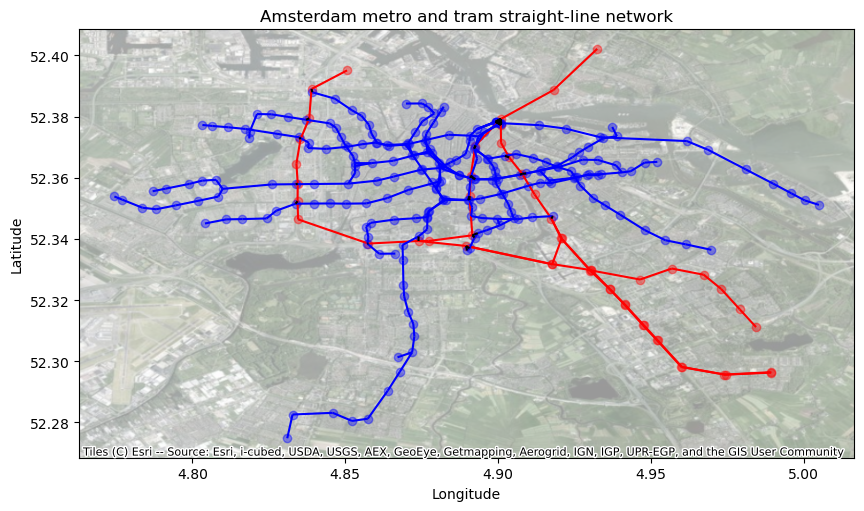

In [136]:
import contextily as ctx
city_sub_new_connected_edges_straight_line_gdf = gpd.GeoDataFrame(city_sub_new_connected_edges_straight_line.copy(), geometry='geometry')
city_tram_new_connected_edges_straight_line_gdf = gpd.GeoDataFrame(city_tram_new_connected_edges_straight_line.copy(), geometry='geometry')
connect_edges_sub_to_tram_oneway_gdf = gpd.GeoDataFrame(connect_edges_sub_to_tram_oneway_gdf.copy(), geometry='geometry')

fig, ax = plt.subplots(1, 1, figsize=(10, 6))

city_sub_new_half_stations_straight_line_gdf.plot(color='red', alpha=0.4, ax=ax, legend=True)
city_sub_new_connected_edges_straight_line_gdf.plot(color='red', ax=ax, legend=True)
city_tram_new_half_stations_straight_line_gdf.plot(color='blue', alpha=0.4, ax=ax, legend=True)
city_tram_new_connected_edges_straight_line_gdf.plot(color='blue', ax=ax, legend=True)
connect_edges_sub_to_tram_oneway_gdf.plot(color='black', ax=ax, legend=True)
metro_lines = gpd.read_file("./Metro lines.GPKG")
ctx.add_basemap(ax=ax, crs=metro_lines.crs.to_string(), source=ctx.providers.Esri.WorldImagery, alpha=0.4)

ax.set_title('Amsterdam metro and tram straight-line network')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')


plt.show()

# Create OD pairs

In [135]:
def get_first_last_points_route_dict(route_dict):
    origin_df = pd.DataFrame()
    for route_name, station_df in route_dict.items():
        first_last_points = station_df.iloc[[0, -1]]
        origin_df = pd.concat([origin_df, first_last_points])
    return origin_df


origin_df = pd.concat([get_first_last_points_route_dict(city_sub_new_half_order_route_dict),
                       get_first_last_points_route_dict(city_tram_new_half_order_route_dict)])


origin_df.drop_duplicates(subset='geometry', inplace=True)


selected_columns = ['geometry', 'name', 'id']
origin_id_df = origin_df[selected_columns].reset_index(drop=True)

In [136]:
origin_df

,geometry,id,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
0,POINT (4.9891612 52.2964067),328,2,Gein,4.989161,52.296407,"(4.9891612, 52.2964067)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
19,POINT (4.8505958 52.3951031),805,2,Isolatorweg,4.850596,52.395103,"(4.8505958, 52.3951031)",Metro 50: Gein => Isolatorweg,subway,"50, 51","50, 51"
0,POINT (4.9008686 52.3773546),731,2,Centraal Station,4.900869,52.377355,"(4.9008686, 52.3773546)",Metro 51: Centraal Station => Isolatorweg,subway,"51, 52, 53, 54","51, 52, 53, 54"
0,POINT (4.932402 52.4021571),630,2,Noord,4.932402,52.402157,"(4.932402, 52.4021571)",Metro 52: Noord => Zuid,subway,52,None
7,POINT (4.8772326 52.3393181),180,3,Zuid,4.877233,52.339318,"(4.8772326, 52.3393181)",Metro 52: Noord => Zuid,subway,"50, 51, 52","50, 51, 52"
13,POINT (4.9843391 52.3111615),61,2,Gaasperplas,4.984339,52.311161,"(4.9843391, 52.3111615)",Metro 53: Centraal Station => Gaasperplas,subway,53,None
14,POINT (4.989299 52.2962711),323,2,Gein,4.989299,52.296271,"(4.989299, 52.2962711)",Metro 50: Isolatorweg => Gein,subway,"50, 54","50, 54"
0,POINT (4.9326128 52.3607965),2209,2,Muiderpoortstation,4.932613,52.360796,"(4.9326128, 52.3607965)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
24,POINT (4.7745043 52.3538687),1715,2,Matterhorn,4.774504,52.353869,"(4.7745043, 52.3538687)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,1,None
0,POINT (4.8992878 52.3783193),2177,2,Centraal Station,4.899288,52.378319,"(4.8992878, 52.3783193)",Tram 12: Amsterdam Centraal Station => Amsterd...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"


In [137]:
origin_id_df

,geometry,name,id
0,POINT (4.9891612 52.2964067),Gein,328
1,POINT (4.8505958 52.3951031),Isolatorweg,805
2,POINT (4.9008686 52.3773546),Centraal Station,731
3,POINT (4.932402 52.4021571),Noord,630
4,POINT (4.8772326 52.3393181),Zuid,180
5,POINT (4.9843391 52.3111615),Gaasperplas,61
6,POINT (4.989299 52.2962711),Gein,323
7,POINT (4.9326128 52.3607965),Muiderpoortstation,2209
8,POINT (4.7745043 52.3538687),Matterhorn,1715
9,POINT (4.8992878 52.3783193),Centraal Station,2177


In [138]:
destination_id_df = origin_id_df
destination_id_df

,geometry,name,id
0,POINT (4.9891612 52.2964067),Gein,328
1,POINT (4.8505958 52.3951031),Isolatorweg,805
2,POINT (4.9008686 52.3773546),Centraal Station,731
3,POINT (4.932402 52.4021571),Noord,630
4,POINT (4.8772326 52.3393181),Zuid,180
5,POINT (4.9843391 52.3111615),Gaasperplas,61
6,POINT (4.989299 52.2962711),Gein,323
7,POINT (4.9326128 52.3607965),Muiderpoortstation,2209
8,POINT (4.7745043 52.3538687),Matterhorn,1715
9,POINT (4.8992878 52.3783193),Centraal Station,2177


In [139]:
OD_id_list = []

for index_origin, row_origin in origin_id_df.iterrows():

       
    for index_destination, row_destination in destination_id_df.iterrows():


        if row_origin['name'] != row_destination['name']:
            # Append a dictionary to the list
            OD_id_list.append({
                's_id': row_origin['id'],
                'e_id': row_destination['id']
             })

# Create a DataFrame from the list of dictionaries
OD_id_pairs_df = pd.DataFrame(OD_id_list)  

In [140]:
OD_id_pairs_df

,s_id,e_id
0,328,805
1,328,731
2,328,630
3,328,180
4,328,61
...,...,...
1043,1090,1663
1044,1090,2776
1045,1090,1059
1046,1090,2767


# Test all OD in normal situation

## Load Graph with city_two_layer_network_nodes and city_two_layer_network_edges

In [141]:
city_two_layer_network_nodes = pd.concat([city_sub_new_nodes,city_tram_new_nodes])
city_two_layer_network_nodes.reset_index(drop=True,inplace=True)

In [142]:
city_two_layer_network_nodes

,id,geometry,degree
0,1,POINT (4.9232197 52.3339159),2
1,2,POINT (4.9642294 52.2945339),2
2,4,POINT (4.9622901 52.2955678),2
3,7,POINT (4.8471439 52.3952143),2
4,492,POINT (4.8457805 52.395217),3
...,...,...,...
2084,2777,POINT (4.9009806 52.3777485),2
2085,2779,POINT (4.8987647 52.3785952),2
2086,2780,POINT (4.8988204 52.3786244),2
2087,2754,POINT (4.8988712 52.3786582),2


In [143]:
city_two_layer_network_stations = pd.concat([city_sub_new_half_stations_straight_line_gdf,city_tram_new_half_stations_straight_line_gdf])
city_two_layer_network_stations.reset_index(drop=True,inplace=True)

In [144]:
city_two_layer_network_stations

,geometry,id,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
0,POINT (4.98916 52.29641),328,2,Gein,4.989161,52.296407,"(4.9891612, 52.2964067)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
1,POINT (4.97400 52.29564),855,2,Reigersbos,4.974000,52.295637,"(4.9740002, 52.2956365)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
2,POINT (4.96013 52.29813),854,2,Holendrecht,4.960126,52.298132,"(4.9601264, 52.2981319)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
3,POINT (4.95213 52.30687),810,2,Bullewijk,4.952129,52.306869,"(4.9521292, 52.306869)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
4,POINT (4.94762 52.31181),809,2,Bijlmer ArenA,4.947618,52.311806,"(4.9476178, 52.311806)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
...,...,...,...,...,...,...,...,...,...,...,...
286,POINT (4.83128 52.37989),2526,2,Burgemeester Fockstraat,4.831279,52.379891,"(4.8312794, 52.3798913)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
287,POINT (4.82581 52.38075),2533,2,Burgemeester Eliasstraat,4.825810,52.380750,"(4.8258104, 52.38075)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
288,POINT (4.82116 52.38084),2528,2,Plein '40-'45,4.821159,52.380837,"(4.8211591, 52.3808373)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
289,POINT (4.81875 52.37507),2509,2,Burgemeester Roëllstraat,4.818751,52.375067,"(4.8187509, 52.3750672)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None


In [145]:
len(city_sub_new_connected_edges_straight_line)

64

In [146]:
len(city_tram_new_connected_edges_straight_line)

307

In [147]:
len(connect_edges_sub_to_tram_oneway)

38

In [148]:
city_two_layer_network_edges = pd.concat([city_sub_new_connected_edges_straight_line,city_tram_new_connected_edges_straight_line,connect_edges_sub_to_tram_oneway])
city_two_layer_network_edges.reset_index(drop=True,inplace=True)

In [149]:
city_two_layer_network_edges

,geometry,from_id,to_id,route_name_list,distance,time,weights,from_to,to_from,id
0,"LINESTRING (4.9891612 52.2964067, 4.9740002 52...",328,855,Metro 50: Gein => Isolatorweg,1693.527311,4,1694,NaN,NaN,NaN
1,"LINESTRING (4.9740002 52.2956365, 4.9601264 52...",855,854,Metro 50: Gein => Isolatorweg,1609.832708,4,1610,NaN,NaN,NaN
2,"LINESTRING (4.9601264 52.2981319, 4.9521292 52...",854,810,Metro 50: Gein => Isolatorweg,1822.740985,4,1823,NaN,NaN,NaN
3,"LINESTRING (4.9521292 52.306869, 4.9476178 52....",810,809,Metro 50: Gein => Isolatorweg,1029.674063,2,1030,NaN,NaN,NaN
4,"LINESTRING (4.9476178 52.311806, 4.9413977 52....",809,808,Metro 50: Gein => Isolatorweg,1419.649855,3,1420,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
404,"LINESTRING (4.8910469 52.3606866, 4.8909623 52...",861,2386,NaN,143.12934,15,9013.0,"(861, 2386)","(2386, 861)",3289.0
405,"LINESTRING (4.9036061 52.3666363, 4.9022284 52...",459,2586,NaN,181.772452,15,9013.0,"(459, 2586)","(2586, 459)",3290.0
406,"LINESTRING (4.9078472 52.3613094, 4.9091584 52...",460,2449,NaN,146.981525,15,9013.0,"(460, 2449)","(2449, 460)",3291.0
407,"LINESTRING (4.9078472 52.3613094, 4.9071213 52...",460,2448,NaN,98.324093,15,9013.0,"(460, 2448)","(2448, 460)",3292.0


In [150]:
city_two_layer_network_edges['from_to'] = city_two_layer_network_edges.apply(lambda row: (row['from_id'], row['to_id']), axis=1)
city_two_layer_network_edges['to_from'] = city_two_layer_network_edges.apply(lambda row: (row['to_id'], row['from_id']), axis=1)

In [151]:
G1 = nx.Graph()
for node_index, row in city_two_layer_network_stations.iterrows():
    geometry = row['geometry']
    node_id = row['id']
    x,y = geometry.x, geometry.y
    G1.add_node(node_id, pos = (x,y))

In [152]:
edges_for_G1 = city_two_layer_network_edges[['from_id', 'to_id', 'time', 'weights']]
# edges_for_G1['time'] = edges_for_G1['time']
# edges_for_G1['weights'] = edges_for_G1['weights']
for edges, row in edges_for_G1.iterrows():
    from_id = row['from_id']
    to_id = row['to_id']
    weight = row['time']
    # capacity = row['capacity']
    # length = row['weights']
    G1.add_edge(from_id, to_id, weight = weight)

## Test all OD pairs

In [153]:
destination_id_df

,geometry,name,id
0,POINT (4.9891612 52.2964067),Gein,328
1,POINT (4.8505958 52.3951031),Isolatorweg,805
2,POINT (4.9008686 52.3773546),Centraal Station,731
3,POINT (4.932402 52.4021571),Noord,630
4,POINT (4.8772326 52.3393181),Zuid,180
5,POINT (4.9843391 52.3111615),Gaasperplas,61
6,POINT (4.989299 52.2962711),Gein,323
7,POINT (4.9326128 52.3607965),Muiderpoortstation,2209
8,POINT (4.7745043 52.3538687),Matterhorn,1715
9,POINT (4.8992878 52.3783193),Centraal Station,2177


In [154]:
OD_shortest_path_nodes_id = {}
OD_shortest_path_edges = {}

for index, row in OD_id_pairs_df.iterrows():
    path_s_e, length_s_e, short_path_edges = shortest_path(G1, row.s_id, row.e_id, city_two_layer_network_edges, weight = "time")
    OD_shortest_path_nodes_id[index] = path_s_e
    short_path_edges.drop_duplicates(subset='geometry', inplace=True)
    OD_shortest_path_edges[index] = short_path_edges

In [155]:
OD_shortest_path_edges

{0:                                              geometry from_id to_id  \
 0   LINESTRING (4.9891612 52.2964067, 4.9740002 52...     328   855   
 1   LINESTRING (4.9740002 52.2956365, 4.9601264 52...     855   854   
 2   LINESTRING (4.9601264 52.2981319, 4.9521292 52...     854   810   
 3   LINESTRING (4.9521292 52.306869, 4.9476178 52....     810   809   
 4   LINESTRING (4.9476178 52.311806, 4.9413977 52....     809   808   
 5   LINESTRING (4.9413977 52.3186119, 4.9365601 52...     808   852   
 6   LINESTRING (4.9365601 52.3236024, 4.9304544 52...     852   828   
 7   LINESTRING (4.9304544 52.3297847, 4.9176063 52...     828   838   
 8   LINESTRING (4.9176063 52.3317688, 4.889539 52....     838   857   
 9   LINESTRING (4.889539 52.337689, 4.8739633 52.3...     857   840   
 10  LINESTRING (4.8739633 52.3393223, 4.8575709 52...     840   835   
 11  LINESTRING (4.8575709 52.3384751, 4.8345741 52...     835   841   
 12  LINESTRING (4.8345741 52.3463868, 4.834401 52....     84

In [156]:
len(OD_shortest_path_nodes_id)

1048

In [157]:
len(OD_shortest_path_edges)

1048

## Mean time and distance

In [158]:
def od_time_distance_df(OD_shortest_path_edges):
    for od,edges_df in OD_shortest_path_edges.items():
        edges_df['total_time'] = edges_df['time'].sum()
        edges_df['total_distance'] = edges_df['distance'].sum()
    
    result_df = pd.DataFrame()
    
    for od,edges_df in OD_shortest_path_edges.items():
    
        first_row = edges_df.iloc[0]
        result_df = pd.concat([result_df,first_row.to_frame().T])
        
    result_df.index = OD_shortest_path_edges.keys()
    result_df = result_df[['total_time','total_distance']]
    result_df['od_num'] = result_df.index
    result_df.reset_index(drop=True,inplace=True)
    
    mean_time = result_df['total_time'].mean()
    mean_distance = result_df['total_distance'].mean()
    mean_result_df = pd.DataFrame({'mean_time': [mean_time],'mean_distance': [mean_distance]})    
         
    return result_df, mean_result_df

In [159]:
od_time_distance_result_df, od_time_distance_mean_result_df = od_time_distance_df(OD_shortest_path_edges)

In [160]:
od_time_distance_result_df

,total_time,total_distance,od_num
0,74,30784.762123,0
1,61,19352.281017,1
2,88,31184.993848,2
3,54,16850.88744,3
4,58,18062.680145,4
...,...,...,...
1043,76,16337.048231,1043
1044,91,11825.377694,1044
1045,105,22399.475605,1045
1046,67,12402.084599,1046


In [161]:
od_time_distance_mean_result_df

,mean_time,mean_distance
0,78.208969,16225.192185


## Number of times an edge is used

In [162]:
# OD_shortest_path_edges_df = pd.DataFrame()

# for od,edges_df in OD_shortest_path_edges.items():

#     OD_shortest_path_edges_df = pd.concat([OD_shortest_path_edges_df,edges_df])

# OD_shortest_path_edges_value_counts = OD_shortest_path_edges_df['from_to'].value_counts()
# OD_shortest_path_edges_value_counts_df = OD_shortest_path_edges_value_counts.reset_index()
# # OD_shortest_path_edges_value_counts_df.columns = ['geometry', 'count_number']

In [163]:
# OD_shortest_path_edges_value_counts_df

In [164]:
def edges_used_time_count(OD_shortest_path_edges,city_two_layer_network_edges):
    OD_shortest_path_edges_df = pd.DataFrame()

    for od,edges_df in OD_shortest_path_edges.items():
    
        OD_shortest_path_edges_df = pd.concat([OD_shortest_path_edges_df,edges_df])
    
    OD_shortest_path_edges_value_counts = OD_shortest_path_edges_df['geometry'].value_counts()
    OD_shortest_path_edges_value_counts_df = OD_shortest_path_edges_value_counts.reset_index()
    OD_shortest_path_edges_value_counts_all_df = pd.merge(OD_shortest_path_edges_value_counts_df,city_two_layer_network_edges,on='geometry',how='left')
    return OD_shortest_path_edges_value_counts_all_df

In [165]:
OD_shortest_path_edges_value_counts_all_df = edges_used_time_count(OD_shortest_path_edges,city_two_layer_network_edges)

In [166]:
OD_shortest_path_edges_value_counts_all_df

,geometry,count,from_id,to_id,route_name_list,distance,time,weights,from_to,to_from,id
0,"LINESTRING (4.8739633 52.3393223, 4.8575709 52...",269,840,835,Metro 50: Gein => Isolatorweg,1831.310324,4,1831,"(840, 835)","(835, 840)",NaN
1,"LINESTRING (4.8910469 52.3606866, 4.8906476 52...",268,861,863,Metro 52: Noord => Zuid,1227.144866,3,1227,"(861, 863)","(863, 861)",NaN
2,"LINESTRING (4.8906476 52.3539585, 4.8915605 52...",268,863,860,Metro 52: Noord => Zuid,2331.129433,6,2331,"(863, 860)","(860, 863)",NaN
3,"LINESTRING (4.9008785 52.3792082, 4.8925639 52...",266,816,813,Metro 52: Noord => Zuid,1831.797631,4,1832,"(816, 813)","(813, 816)",NaN
4,"LINESTRING (4.8925639 52.3705391, 4.8910469 52...",266,813,861,Metro 52: Noord => Zuid,1804.086027,4,1804,"(813, 861)","(861, 813)",NaN
...,...,...,...,...,...,...,...,...,...,...,...
285,"LINESTRING (4.9336328 52.3611749, 4.9405051 52...",2,1840,2563,Tram 1: Amsterdam Osdorp de Aker => Amsterdam ...,771.934815,3,772,"(1840, 2563)","(2563, 1840)",NaN
286,"LINESTRING (4.9302391 52.3297174, 4.9300743 52...",2,826,825,NaN,21.600584,15,9566.0,"(826, 825)","(825, 826)",3172.0
287,"LINESTRING (4.8806042 52.3587143, 4.8812446 52...",2,2769,2407,NaN,75.700359,15,9401.0,"(2769, 2407)","(2407, 2769)",3251.0
288,"LINESTRING (4.9326128 52.3607965, 4.9336328 52...",2,2209,1840,NaN,132.855253,15,9401.0,"(2209, 1840)","(1840, 2209)",3240.0


In [167]:
# OD_shortest_path_edges_df = pd.DataFrame()

# for od,edges_df in OD_shortest_path_edges.items():

#     OD_shortest_path_edges_df = pd.concat([OD_shortest_path_edges_df,edges_df])

# OD_shortest_path_edges_value_counts = OD_shortest_path_edges_df['geometry'].value_counts()
# OD_shortest_path_edges_value_counts_df = OD_shortest_path_edges_value_counts.reset_index()
# # OD_shortest_path_edges_value_counts_df.columns = ['geometry', 'count_number']

In [168]:
# OD_shortest_path_edges_value_counts_df

In [169]:
# OD_shortest_path_edges_value_counts_all_df = pd.merge(OD_shortest_path_edges_value_counts_df,city_two_layer_network_edges,on='geometry',how='left')

In [170]:
# OD_shortest_path_edges_value_counts_all_df

## Output results in QGIS and Excel

In [171]:
od_33 = OD_shortest_path_edges[33]
gpd.GeoDataFrame(od_33[['geometry','from_id','to_id','route_name_list','distance','time','weights']]).to_file('od_33_0702.GPKG',driver='GPKG')

In [172]:
od_107 = OD_shortest_path_edges[107]
gpd.GeoDataFrame(od_107[['geometry','from_id','to_id','route_name_list','distance','time','weights']]).to_file('od_107_0702.GPKG',driver='GPKG')

In [173]:
od_247 = OD_shortest_path_edges[247]
gpd.GeoDataFrame(od_247[['geometry','from_id','to_id','route_name_list','distance','time','weights']]).to_file('od_247_0702.GPKG',driver='GPKG')

In [174]:
od_300 = OD_shortest_path_edges[300]
gpd.GeoDataFrame(od_300[['geometry','from_id','to_id','route_name_list','distance','time','weights']]).to_file('od_300_0702.GPKG',driver='GPKG')

In [175]:
gpd.GeoDataFrame(city_sub_new_half_stations_straight_line_gdf[['id', 'geometry','name','geo_x','geo_y','route_name_list','ref','transfer','route']]).to_file('city_sub_new_half_stations_straight_line_df0702.GPKG',driver='GPKG')
gpd.GeoDataFrame(city_sub_new_connected_edges_straight_line[['geometry', 'from_id', 'to_id', 'route_name_list', 'distance', 'time', 'weights']]).to_file('city_sub_new_connected_edges_straight_line0702.GPKG',driver='GPKG')

In [176]:
gpd.GeoDataFrame(city_tram_new_half_stations_straight_line_gdf[['id', 'geometry','name','geo_x','geo_y','route_name_list','ref','transfer','route']]).to_file('city_tram_new_half_stations_straight_line_df0702.GPKG',driver='GPKG')
gpd.GeoDataFrame(city_tram_new_connected_edges_straight_line[['geometry', 'from_id', 'to_id', 'route_name_list', 'distance', 'time', 'weights']]).to_file('city_tram_new_connected_edges_straight_line0702.GPKG',driver='GPKG')

In [177]:
gpd.GeoDataFrame(connect_edges_sub_to_tram_oneway[['geometry', 'from_id', 'to_id', 'distance', 'time', 'weights']]).to_file('connect_edges_sub_to_tram_oneway0702.GPKG',driver='GPKG')

In [178]:
# city_sub_new_half_stations_straight_line_gdf[['id','geo_x','geo_y','route_name_list','ref']].to_excel('city_sub_new_half_stations_straight_line_df0702.xlsx',header = True,index = False)

In [179]:
# city_tram_new_half_stations_straight_line_gdf[['id','geo_x','geo_y','route_name_list','ref']].to_excel('city_tram_new_half_stations_straight_line_df0702.xlsx',header = True,index = False)

In [180]:
# city_sub_new_connected_edges_straight_line[['from_id', 'to_id', 'route_name_list','distance', 'time']].to_excel('city_sub_new_connected_edges_straight_line0702.xlsx',header = True,index = False)

In [181]:
# city_tram_new_connected_edges_straight_line[['from_id', 'to_id', 'route_name_list','distance', 'time']].to_excel('city_tram_new_connected_edges_straight_line0702.xlsx',header = True,index = False)

In [182]:
# connect_edges_sub_to_tram_oneway[['from_id', 'to_id','distance', 'time']].to_excel('connect_edges_sub_to_tram_oneway0702.xlsx',header = True,index = False)

In [183]:
len(city_sub_new_half_stations_straight_line_df)

52

In [184]:
len(city_tram_new_half_stations_straight_line_df)

239

In [185]:
len(city_sub_new_connected_edges_straight_line)

64

# Disruption simulation

In [186]:
def new_half_stations_flood_probability(gpkg_file_route):
    city_sub_new_half_stations_flood_probability = gpd.read_file(gpkg_file_route)
    reseted_columns = ['geometry','id','name','geo_x','geo_y','route_name_list','ref','transfer','route','flood_probability_category1']
    city_sub_new_half_stations_flood_probability1 = city_sub_new_half_stations_flood_probability[reseted_columns]
    return city_sub_new_half_stations_flood_probability1

In [187]:
def one_depth_diff_prob_od_test_results(dep20_flood_all_prob_city_sub_new_half_stations,city_two_layer_network_edges,city_two_layer_network_stations):
    prob_category_list = list(dep20_flood_all_prob_city_sub_new_half_stations['flood_probability_category1'].sort_values().drop_duplicates().values)
    prob_category_list = prob_category_list[1:]
    
    one_depth_diff_prob_od_time_distance_dict = {}
    one_depth_diff_prob_od_mean_dict = {}
    one_depth_diff_prob_edges_count_dict = {}
    one_depth_diff_prob_shortest_ids_dict = {}
    one_depth_diff_prob_shortest_paths_dict = {}

    for i in prob_category_list:
        # Filter disrupted stations by probability category
        disrupted_stations_sub = dep20_flood_all_prob_city_sub_new_half_stations[dep20_flood_all_prob_city_sub_new_half_stations['flood_probability_category1'] == i]
        disrupted_stations_id_list_sub = list(disrupted_stations_sub.id)
        
        # Find disrupted edges based on disrupted stations
        disrupted_edges_sub = city_two_layer_network_edges[
            city_two_layer_network_edges['from_id'].isin(disrupted_stations_id_list_sub) | 
            city_two_layer_network_edges['to_id'].isin(disrupted_stations_id_list_sub)
        ]
        
        # Filter out disrupted stations and edges
        city_two_layer_network_stations_after_disruption = city_two_layer_network_stations[
            ~city_two_layer_network_stations['geometry'].isin(disrupted_stations_sub['geometry'])
        ]
        city_two_layer_network_edges_after_disruption = city_two_layer_network_edges[
            ~city_two_layer_network_edges['geometry'].isin(disrupted_edges_sub['geometry'])
        ]
        
        # Create a new graph
        G2 = nx.Graph()
        
        # Add nodes to the graph
        for node_index, row in city_two_layer_network_stations_after_disruption.iterrows():
            geometry = row['geometry']
            node_id = row['id']
            x, y = geometry.x, geometry.y
            G2.add_node(node_id, pos=(x, y))
        
        # Add edges to the graph
        edges_for_G2 = city_two_layer_network_edges_after_disruption[['from_id', 'to_id', 'time', 'weights']]
        for edges_index, row in edges_for_G2.iterrows():
            from_id = row['from_id']
            to_id = row['to_id']
            weight = row['time']
            G2.add_edge(from_id, to_id, weight=weight)  
        
        OD_shortest_path_nodes_id = {}
        OD_shortest_path_edges = {}
        
        # Calculate shortest paths for each OD pair
        for index, row in OD_id_pairs_df.iterrows():
            try:
                path_s_e, length_s_e, short_path_edges = shortest_path(G2, row.s_id, row.e_id, city_two_layer_network_edges_after_disruption, weight="time")
                OD_shortest_path_nodes_id[index] = path_s_e
                short_path_edges.drop_duplicates(subset='geometry', inplace=True)
                OD_shortest_path_edges[index] = short_path_edges
            except nx.NodeNotFound:
                continue  # Skip silently if the node is not found
            except nx.NetworkXNoPath:
                continue  # Skip silently if there is no path
        
        
        od_time_distance_result_df, od_time_distance_mean_result_df = od_time_distance_df(OD_shortest_path_edges)
        one_depth_diff_prob_od_time_distance_dict[i] = od_time_distance_result_df
        one_depth_diff_prob_od_mean_dict[i] = od_time_distance_mean_result_df
        
        OD_shortest_path_edges_value_counts_all_df = edges_used_time_count(OD_shortest_path_edges,city_two_layer_network_edges)
        one_depth_diff_prob_edges_count_dict[i] = OD_shortest_path_edges_value_counts_all_df
        
        # Assign the shortest path edges to the dictionary for the current probability category
        one_depth_diff_prob_shortest_ids_dict[i] = OD_shortest_path_nodes_id
        one_depth_diff_prob_shortest_paths_dict[i] = OD_shortest_path_edges
        
    return prob_category_list, one_depth_diff_prob_od_time_distance_dict, one_depth_diff_prob_od_mean_dict, one_depth_diff_prob_edges_count_dict, one_depth_diff_prob_shortest_ids_dict, one_depth_diff_prob_shortest_paths_dict

## Only metro stations affected by floods

In [188]:
gpkg_file_route_0_sub = "C:\\projects\\UTNCE\\data\\0_flood_probability_city_sub_new_half_stations.GPKG"
dep0_flood_all_prob_city_sub_new_half_stations = new_half_stations_flood_probability(gpkg_file_route_0_sub)
m_prob_category_list0, m_dep0_diff_prop_od_time_distance_dict, m_dep0_diff_prob_od_mean_dict, m_dep0_diff_prob_edges_count_dict, m_dep0_diff_prob_shortest_ids_dict, m_dep0_diff_prob_shortest_paths_dict = one_depth_diff_prob_od_test_results(dep0_flood_all_prob_city_sub_new_half_stations,city_two_layer_network_edges,city_two_layer_network_stations)

In [189]:
gpkg_file_route_20_sub = "C:\\projects\\UTNCE\\data\\20_flood_probability_city_sub_new_half_stations.GPKG"
dep20_flood_all_prob_city_sub_new_half_stations = new_half_stations_flood_probability(gpkg_file_route_20_sub)
m_prob_category_list20, m_dep20_diff_prop_od_time_distance_dict, m_dep20_diff_prob_od_mean_dict, m_dep20_diff_prob_edges_count_dict, m_dep20_diff_prob_shortest_ids_dict, m_dep20_diff_prob_shortest_paths_dict = one_depth_diff_prob_od_test_results(dep20_flood_all_prob_city_sub_new_half_stations,city_two_layer_network_edges,city_two_layer_network_stations)

In [190]:
gpkg_file_route_50_sub = "C:\\projects\\UTNCE\\data\\50_flood_probability_city_sub_new_half_stations.GPKG"
dep50_flood_all_prob_city_sub_new_half_stations = new_half_stations_flood_probability(gpkg_file_route_50_sub)
m_prob_category_list50, m_dep50_diff_prop_od_time_distance_dict, m_dep50_diff_prob_od_mean_dict, m_dep50_diff_prob_edges_count_dict, m_dep50_diff_prob_shortest_ids_dict, m_dep50_diff_prob_shortest_paths_dict = one_depth_diff_prob_od_test_results(dep50_flood_all_prob_city_sub_new_half_stations,city_two_layer_network_edges,city_two_layer_network_stations)

In [191]:
gpkg_file_route_200_sub = "C:\\projects\\UTNCE\\data\\200_flood_probability_city_sub_new_half_stations.GPKG"
dep200_flood_all_prob_city_sub_new_half_stations = new_half_stations_flood_probability(gpkg_file_route_200_sub)
m_prob_category_list200, m_dep200_diff_prop_od_time_distance_dict, m_dep200_diff_prob_od_mean_dict, m_dep200_diff_prob_edges_count_dict, m_dep200_diff_prob_shortest_ids_dict, m_dep200_diff_prob_shortest_paths_dict = one_depth_diff_prob_od_test_results(dep200_flood_all_prob_city_sub_new_half_stations,city_two_layer_network_edges,city_two_layer_network_stations)

In [192]:
m_dep200_diff_prob_od_mean_dict

{1:    mean_time  mean_distance
 0   79.14053   16205.222482,
 2:    mean_time  mean_distance
 0  78.302444   15901.690949}

In [193]:
m_dep50_diff_prob_od_mean_dict

{1:    mean_time  mean_distance
 0  79.185336    16041.45577,
 2:    mean_time  mean_distance
 0  82.488722    14001.96719,
 3:    mean_time  mean_distance
 0   79.21087   14882.768966}

In [194]:
m_dep20_diff_prob_od_mean_dict

{1:    mean_time  mean_distance
 0  79.185336    16041.45577,
 2:    mean_time  mean_distance
 0  81.849624   14144.273979,
 3:    mean_time  mean_distance
 0   79.21087   14882.768966}

In [195]:
m_dep0_diff_prob_od_mean_dict

{1:    mean_time  mean_distance
 0  83.810591   16072.397328,
 2:    mean_time  mean_distance
 0  81.704261   14129.100587,
 3:    mean_time  mean_distance
 0  79.095652   14805.578354}

## Only tram stations affected by floods

In [196]:
gpkg_file_route_0_tram = "C:\\projects\\UTNCE\\data\\0_flood_probability_city_tram_new_half_stations.GPKG"
dep0_flood_all_prob_city_tram_new_half_stations = new_half_stations_flood_probability(gpkg_file_route_0_tram)
t_prob_category_list0, t_dep0_diff_prop_od_time_distance_dict, t_dep0_diff_prob_od_mean_dict, t_dep0_diff_prob_edges_count_dict, t_dep0_diff_prob_shortest_ids_dict, t_dep0_diff_prob_shortest_paths_dict = one_depth_diff_prob_od_test_results(dep0_flood_all_prob_city_tram_new_half_stations,city_two_layer_network_edges,city_two_layer_network_stations)

In [197]:
gpkg_file_route_20_tram = "C:\\projects\\UTNCE\\data\\20_flood_probability_city_tram_new_half_stations.GPKG"
dep20_flood_all_prob_city_tram_new_half_stations = new_half_stations_flood_probability(gpkg_file_route_20_tram)
t_prob_category_list20, t_dep20_diff_prop_od_time_distance_dict, t_dep20_diff_prob_od_mean_dict, t_dep20_diff_prob_edges_count_dict, t_dep20_diff_prob_shortest_ids_dict, t_dep20_diff_prob_shortest_paths_dict = one_depth_diff_prob_od_test_results(dep20_flood_all_prob_city_tram_new_half_stations,city_two_layer_network_edges,city_two_layer_network_stations)

In [198]:
gpkg_file_route_50_tram = "C:\\projects\\UTNCE\\data\\50_flood_probability_city_tram_new_half_stations.GPKG"
dep50_flood_all_prob_city_tram_new_half_stations = new_half_stations_flood_probability(gpkg_file_route_50_tram)
t_prob_category_list50, t_dep50_diff_prop_od_time_distance_dict, t_dep50_diff_prob_od_mean_dict, t_dep50_diff_prob_edges_count_dict, t_dep50_diff_prob_shortest_ids_dict, t_dep50_diff_prob_shortest_paths_dict = one_depth_diff_prob_od_test_results(dep50_flood_all_prob_city_tram_new_half_stations,city_two_layer_network_edges,city_two_layer_network_stations)

In [199]:
gpkg_file_route_200_tram = "C:\\projects\\UTNCE\\data\\200_flood_probability_city_tram_new_half_stations.GPKG"
dep200_flood_all_prob_city_tram_new_half_stations = new_half_stations_flood_probability(gpkg_file_route_200_tram)
t_prob_category_list200, t_dep200_diff_prop_od_time_distance_dict, t_dep200_diff_prob_od_mean_dict, t_dep200_diff_prob_edges_count_dict, t_dep200_diff_prob_shortest_ids_dict, t_dep200_diff_prob_shortest_paths_dict = one_depth_diff_prob_od_test_results(dep200_flood_all_prob_city_tram_new_half_stations,city_two_layer_network_edges,city_two_layer_network_stations)

In [200]:
t_dep200_diff_prob_od_mean_dict

{2:    mean_time  mean_distance
 0    77.1222   16040.288823,
 3:    mean_time  mean_distance
 0  76.936864   15969.722513}

In [201]:
t_dep50_diff_prob_od_mean_dict

{1:    mean_time  mean_distance
 0  76.340108   16277.788632,
 2:    mean_time  mean_distance
 0  71.216802   14896.891353,
 3:    mean_time  mean_distance
 0  74.474299   15468.397026}

In [202]:
t_dep20_diff_prob_od_mean_dict

{1:    mean_time  mean_distance
 0  80.122807   17254.342603,
 2:    mean_time  mean_distance
 0  70.912548   15174.055363,
 3:    mean_time  mean_distance
 0  74.474299   15468.397026}

In [203]:
t_dep0_diff_prob_od_mean_dict

{1:    mean_time  mean_distance
 0  74.012448   16640.142867,
 2:    mean_time  mean_distance
 0  71.997685   15904.300089,
 3:    mean_time  mean_distance
 0  73.273869   15229.019956}

## Metro and Tram stations both affected by floods

In [204]:
gpkg_file_route_0_sub = "C:\\projects\\UTNCE\\data\\0_flood_probability_city_sub_new_half_stations.GPKG"
dep0_flood_all_prob_city_sub_new_half_stations = new_half_stations_flood_probability(gpkg_file_route_0_sub)
gpkg_file_route_0_tram = "C:\\projects\\UTNCE\\data\\0_flood_probability_city_tram_new_half_stations.GPKG"
dep0_flood_all_prob_city_tram_new_half_stations = new_half_stations_flood_probability(gpkg_file_route_0_tram)
dep0_flood_all_prob_city_new_half_stations = pd.concat([dep0_flood_all_prob_city_sub_new_half_stations,dep0_flood_all_prob_city_tram_new_half_stations])
mt_prob_category_list0, mt_dep0_diff_prop_od_time_distance_dict, mt_dep0_diff_prob_od_mean_dict, mt_dep0_diff_prob_edges_count_dict, mt_dep0_diff_prob_shortest_ids_dict, mt_dep0_diff_prob_shortest_paths_dict = one_depth_diff_prob_od_test_results(dep0_flood_all_prob_city_new_half_stations,city_two_layer_network_edges,city_two_layer_network_stations)

In [205]:
gpkg_file_route_20_sub = "C:\\projects\\UTNCE\\data\\20_flood_probability_city_sub_new_half_stations.GPKG"
dep20_flood_all_prob_city_sub_new_half_stations = new_half_stations_flood_probability(gpkg_file_route_20_sub)
gpkg_file_route_20_tram = "C:\\projects\\UTNCE\\data\\20_flood_probability_city_tram_new_half_stations.GPKG"
dep20_flood_all_prob_city_tram_new_half_stations = new_half_stations_flood_probability(gpkg_file_route_20_tram)
dep20_flood_all_prob_city_new_half_stations = pd.concat([dep20_flood_all_prob_city_sub_new_half_stations,dep20_flood_all_prob_city_tram_new_half_stations])
mt_prob_category_list20, mt_dep20_diff_prop_od_time_distance_dict, mt_dep20_diff_prob_od_mean_dict, mt_dep20_diff_prob_edges_count_dict, mt_dep20_diff_prob_shortest_ids_dict, mt_dep20_diff_prob_shortest_paths_dict = one_depth_diff_prob_od_test_results(dep20_flood_all_prob_city_new_half_stations,city_two_layer_network_edges,city_two_layer_network_stations)

In [206]:
gpkg_file_route_50_sub = "C:\\projects\\UTNCE\\data\\50_flood_probability_city_sub_new_half_stations.GPKG"
dep50_flood_all_prob_city_sub_new_half_stations = new_half_stations_flood_probability(gpkg_file_route_50_sub)
gpkg_file_route_50_tram = "C:\\projects\\UTNCE\\data\\50_flood_probability_city_tram_new_half_stations.GPKG"
dep50_flood_all_prob_city_tram_new_half_stations = new_half_stations_flood_probability(gpkg_file_route_50_tram)
dep50_flood_all_prob_city_new_half_stations = pd.concat([dep50_flood_all_prob_city_sub_new_half_stations,dep50_flood_all_prob_city_tram_new_half_stations])
mt_prob_category_list50, mt_dep50_diff_prop_od_time_distance_dict, mt_dep50_diff_prob_od_mean_dict, mt_dep50_diff_prob_edges_count_dict, mt_ep50_diff_prob_shortest_ids_dict, mt_dep50_diff_prob_shortest_paths_dict = one_depth_diff_prob_od_test_results(dep50_flood_all_prob_city_tram_new_half_stations,city_two_layer_network_edges,city_two_layer_network_stations)

In [207]:
gpkg_file_route_200_sub = "C:\\projects\\UTNCE\\data\\200_flood_probability_city_sub_new_half_stations.GPKG"
dep200_flood_all_prob_city_sub_new_half_stations = new_half_stations_flood_probability(gpkg_file_route_200_sub)
gpkg_file_route_200_tram = "C:\\projects\\UTNCE\\data\\200_flood_probability_city_tram_new_half_stations.GPKG"
dep200_flood_all_prob_city_tram_new_half_stations = new_half_stations_flood_probability(gpkg_file_route_200_tram)
dep200_flood_all_prob_city_new_half_stations = pd.concat([dep200_flood_all_prob_city_sub_new_half_stations,dep200_flood_all_prob_city_tram_new_half_stations])
mt_prob_category_list200, mt_dep200_diff_prop_od_time_distance_dict, mt_dep200_diff_prob_od_mean_dict, mt_dep200_diff_prob_edges_count_dict, mt_dep200_diff_prob_shortest_ids_dict, mt_dep200_diff_prob_shortest_paths_dict = one_depth_diff_prob_od_test_results(dep200_flood_all_prob_city_tram_new_half_stations,city_two_layer_network_edges,city_two_layer_network_stations)

In [208]:
mt_dep200_diff_prob_od_mean_dict

{2:    mean_time  mean_distance
 0    77.1222   16040.288823,
 3:    mean_time  mean_distance
 0  76.936864   15969.722513}

In [209]:
mt_dep50_diff_prob_od_mean_dict

{1:    mean_time  mean_distance
 0  76.340108   16277.788632,
 2:    mean_time  mean_distance
 0  71.216802   14896.891353,
 3:    mean_time  mean_distance
 0  74.474299   15468.397026}

In [210]:
mt_dep20_diff_prob_od_mean_dict

{1:    mean_time  mean_distance
 0  85.004762    17745.90952,
 2:    mean_time  mean_distance
 0  77.787356   12127.436772,
 3:    mean_time  mean_distance
 0  74.332432   13755.819864}

In [211]:
mt_dep0_diff_prob_od_mean_dict

{1:    mean_time  mean_distance
 0  73.195652   16804.964291,
 2:    mean_time  mean_distance
 0  79.103704   12509.336532,
 3:    mean_time  mean_distance
 0  73.283626   13476.484138}

In [212]:
for key in mt_dep0_diff_prob_od_mean_dict:
        mt_dep0_diff_prob_od_mean_dict[key]['flood_probability_category'] = key
mt_dep0_diff_prob_od_mean_dict

{1:    mean_time  mean_distance  flood_probability_category
 0  73.195652   16804.964291                           1,
 2:    mean_time  mean_distance  flood_probability_category
 0  79.103704   12509.336532                           2,
 3:    mean_time  mean_distance  flood_probability_category
 0  73.283626   13476.484138                           3}

In [250]:
def extended_od_mean_dfs(one_dep_diff_prob_od_mean_dict,flood_depth,one_dep_diff_prob_shortest_paths_dict,disruption_scenario):
    extended_one_dep_diff_prob_od_mean_dfs = pd.DataFrame()
    # Add keys as a new column to each DataFrame
    for key in one_dep_diff_prob_od_mean_dict:
        one_dep_diff_prob_od_mean_dict[key]['flood_probability_category'] = key
        one_dep_diff_prob_od_mean_dict[key]['flood_depth'] = flood_depth
        one_dep_diff_prob_od_mean_dict[key]['disruption_scenario'] = disruption_scenario
        one_dep_diff_prob_od_mean_dict[key]['remained_od_num'] = len(one_dep_diff_prob_shortest_paths_dict[key])
        extended_one_dep_diff_prob_od_mean_dfs = pd.concat([extended_one_dep_diff_prob_od_mean_dfs,one_dep_diff_prob_od_mean_dict[key]])
        extended_one_dep_diff_prob_od_mean_dfs.reset_index(drop=True,inplace=True)
    return extended_one_dep_diff_prob_od_mean_dfs

In [251]:
mt_extended_dep0_diff_prob_od_mean_dfs = extended_od_mean_dfs(mt_dep0_diff_prob_od_mean_dict,0,mt_dep0_diff_prob_shortest_paths_dict,'metro_tram_stations')
mt_extended_dep0_diff_prob_od_mean_dfs

,mean_time,mean_distance,flood_probability_category,flood_depth,disruption_scenario,remained_od_num
0,73.195652,16804.964291,1,0,metro_tram_stations,184
1,79.103704,12509.336532,2,0,metro_tram_stations,270
2,73.283626,13476.484138,3,0,metro_tram_stations,684


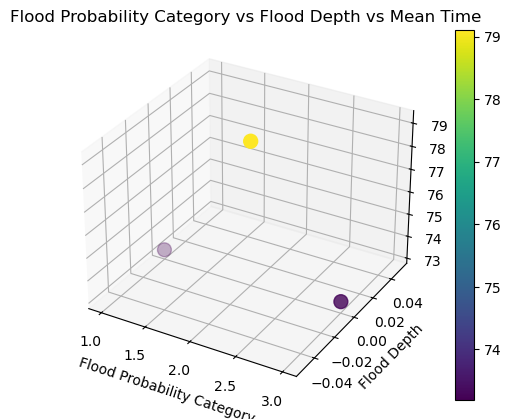

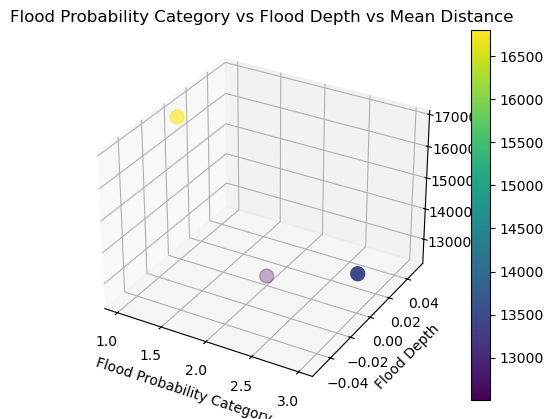

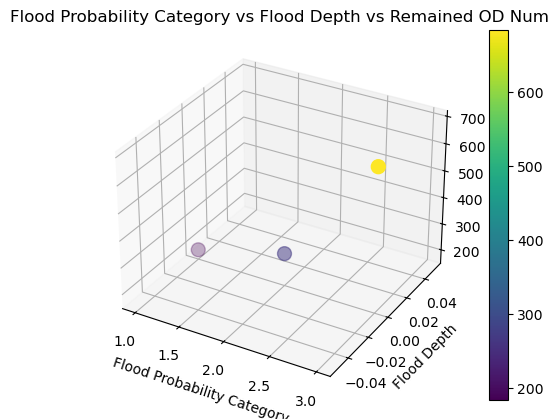

In [255]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


# Plotting function
def plot_3d_scatter(x, y, z, c, x_label, y_label, z_label, title):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    sc = ax.scatter(x, y, z, c=c, cmap='viridis', s=100)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_zlabel(z_label)
    plt.title(title)
    plt.colorbar(sc)
    plt.show()

# Plot 1: flood_probability_category vs flood_depth vs mean_time
plot_3d_scatter(
    mt_extended_dep0_diff_prob_od_mean_dfs['flood_probability_category'],
    mt_extended_dep0_diff_prob_od_mean_dfs['flood_depth'],
    mt_extended_dep0_diff_prob_od_mean_dfs['mean_time'],
    mt_extended_dep0_diff_prob_od_mean_dfs['mean_time'],
    'Flood Probability Category',
    'Flood Depth',
    'Mean Time',
    'Flood Probability Category vs Flood Depth vs Mean Time'
)

# Plot 2: flood_probability_category vs flood_depth vs mean_distance
plot_3d_scatter(
    mt_extended_dep0_diff_prob_od_mean_dfs['flood_probability_category'],
    mt_extended_dep0_diff_prob_od_mean_dfs['flood_depth'],
    mt_extended_dep0_diff_prob_od_mean_dfs['mean_distance'],
    mt_extended_dep0_diff_prob_od_mean_dfs['mean_distance'],
    'Flood Probability Category',
    'Flood Depth',
    'Mean Distance',
    'Flood Probability Category vs Flood Depth vs Mean Distance'
)

# Plot 3: flood_probability_category vs flood_depth vs remained_od_num
plot_3d_scatter(
    mt_extended_dep0_diff_prob_od_mean_dfs['flood_probability_category'],
    mt_extended_dep0_diff_prob_od_mean_dfs['flood_depth'],
    mt_extended_dep0_diff_prob_od_mean_dfs['remained_od_num'],
    mt_extended_dep0_diff_prob_od_mean_dfs['remained_od_num'],
    'Flood Probability Category',
    'Flood Depth',
    'Remained OD Num',
    'Flood Probability Category vs Flood Depth vs Remained OD Num'
)

In [252]:
mt_extended_dep20_diff_prob_od_mean_dfs = extended_od_mean_dfs(mt_dep20_diff_prob_od_mean_dict,20,mt_dep20_diff_prob_shortest_paths_dict,'metro_tram_stations')
mt_extended_dep20_diff_prob_od_mean_dfs

,mean_time,mean_distance,flood_probability_category,flood_depth,disruption_scenario,remained_od_num
0,85.004762,17745.909520,1,20,metro_tram_stations,630
1,77.787356,12127.436772,2,20,metro_tram_stations,348
2,74.332432,13755.819864,3,20,metro_tram_stations,740


In [253]:
mt_extended_dep50_diff_prob_od_mean_dfs = extended_od_mean_dfs(mt_dep50_diff_prob_od_mean_dict,50,mt_dep50_diff_prob_shortest_paths_dict,'metro_tram_stations')
mt_extended_dep50_diff_prob_od_mean_dfs

,mean_time,mean_distance,flood_probability_category,flood_depth,disruption_scenario,remained_od_num
0,76.340108,16277.788632,1,50,metro_tram_stations,738
1,71.216802,14896.891353,2,50,metro_tram_stations,738
2,74.474299,15468.397026,3,50,metro_tram_stations,856


In [254]:
mt_extended_dep200_diff_prob_od_mean_dfs = extended_od_mean_dfs(mt_dep200_diff_prob_od_mean_dict,200,mt_dep200_diff_prob_shortest_paths_dict,'metro_tram_stations')
mt_extended_dep200_diff_prob_od_mean_dfs

,mean_time,mean_distance,flood_probability_category,flood_depth,disruption_scenario,remained_od_num
0,77.122200,16040.288823,2,200,metro_tram_stations,982
1,76.936864,15969.722513,3,200,metro_tram_stations,982


In [256]:
mt_extended_diff_dep_diff_prob_od_mean_dfs = pd.concat([mt_extended_dep0_diff_prob_od_mean_dfs,mt_extended_dep20_diff_prob_od_mean_dfs,mt_extended_dep50_diff_prob_od_mean_dfs,mt_extended_dep200_diff_prob_od_mean_dfs])
mt_extended_diff_dep_diff_prob_od_mean_dfs

,mean_time,mean_distance,flood_probability_category,flood_depth,disruption_scenario,remained_od_num
0,73.195652,16804.964291,1,0,metro_tram_stations,184
1,79.103704,12509.336532,2,0,metro_tram_stations,270
2,73.283626,13476.484138,3,0,metro_tram_stations,684
0,85.004762,17745.909520,1,20,metro_tram_stations,630
1,77.787356,12127.436772,2,20,metro_tram_stations,348
2,74.332432,13755.819864,3,20,metro_tram_stations,740
0,76.340108,16277.788632,1,50,metro_tram_stations,738
1,71.216802,14896.891353,2,50,metro_tram_stations,738
2,74.474299,15468.397026,3,50,metro_tram_stations,856
0,77.122200,16040.288823,2,200,metro_tram_stations,982


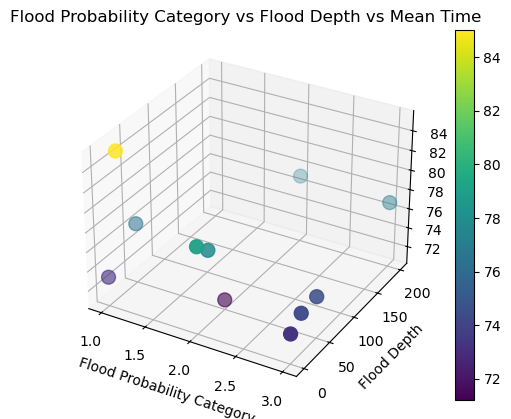

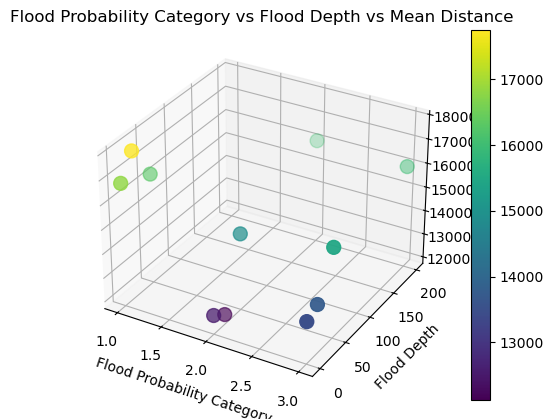

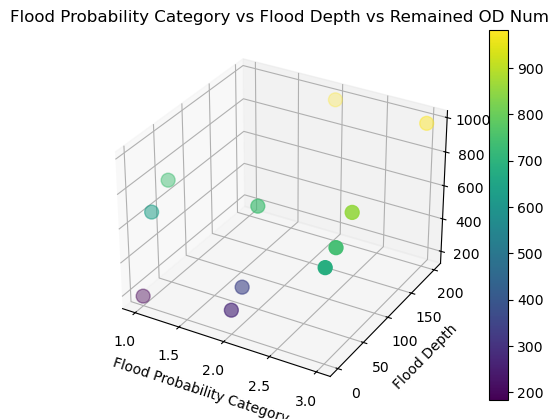

In [257]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


# Plotting function
def plot_3d_scatter(x, y, z, c, x_label, y_label, z_label, title):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    sc = ax.scatter(x, y, z, c=c, cmap='viridis', s=100)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_zlabel(z_label)
    plt.title(title)
    plt.colorbar(sc)
    plt.show()

# Plot 1: flood_probability_category vs flood_depth vs mean_time
plot_3d_scatter(
    mt_extended_diff_dep_diff_prob_od_mean_dfs['flood_probability_category'],
    mt_extended_diff_dep_diff_prob_od_mean_dfs['flood_depth'],
    mt_extended_diff_dep_diff_prob_od_mean_dfs['mean_time'],
    mt_extended_diff_dep_diff_prob_od_mean_dfs['mean_time'],
    'Flood Probability Category',
    'Flood Depth',
    'Mean Time',
    'Flood Probability Category vs Flood Depth vs Mean Time'
)

# Plot 2: flood_probability_category vs flood_depth vs mean_distance
plot_3d_scatter(
    mt_extended_diff_dep_diff_prob_od_mean_dfs['flood_probability_category'],
    mt_extended_diff_dep_diff_prob_od_mean_dfs['flood_depth'],
    mt_extended_diff_dep_diff_prob_od_mean_dfs['mean_distance'],
    mt_extended_diff_dep_diff_prob_od_mean_dfs['mean_distance'],
    'Flood Probability Category',
    'Flood Depth',
    'Mean Distance',
    'Flood Probability Category vs Flood Depth vs Mean Distance'
)

# Plot 3: flood_probability_category vs flood_depth vs remained_od_num
plot_3d_scatter(
    mt_extended_diff_dep_diff_prob_od_mean_dfs['flood_probability_category'],
    mt_extended_diff_dep_diff_prob_od_mean_dfs['flood_depth'],
    mt_extended_diff_dep_diff_prob_od_mean_dfs['remained_od_num'],
    mt_extended_diff_dep_diff_prob_od_mean_dfs['remained_od_num'],
    'Flood Probability Category',
    'Flood Depth',
    'Remained OD Num',
    'Flood Probability Category vs Flood Depth vs Remained OD Num'
)

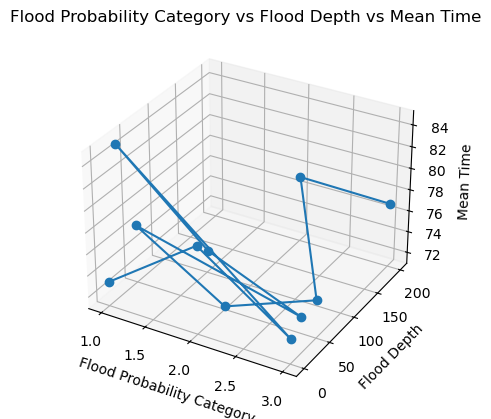

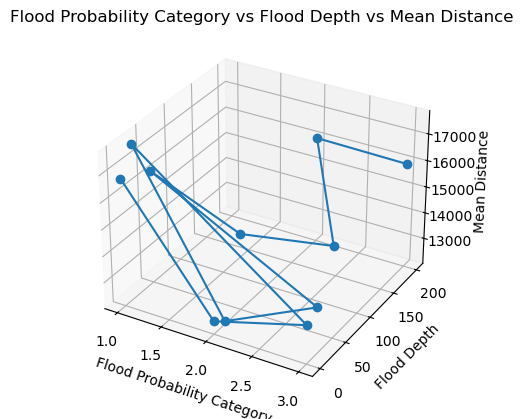

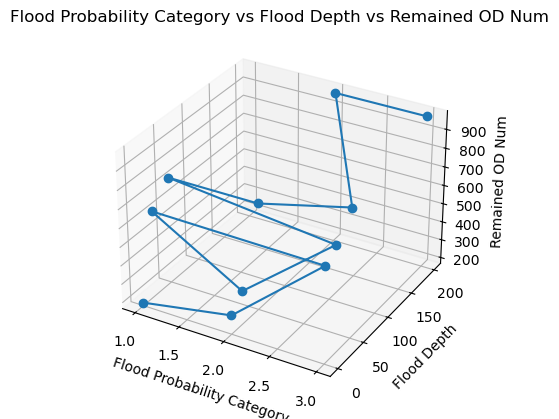

In [259]:
def plot_3d_line(x, y, z, x_label, y_label, z_label, title):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.plot(x, y, z, marker='o')
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_zlabel(z_label)
    plt.title(title)
    plt.show()
# Plot 1: flood_probability_category vs flood_depth vs mean_time
plot_3d_line(
    mt_extended_diff_dep_diff_prob_od_mean_dfs['flood_probability_category'],
    mt_extended_diff_dep_diff_prob_od_mean_dfs['flood_depth'],
    mt_extended_diff_dep_diff_prob_od_mean_dfs['mean_time'],
    'Flood Probability Category',
    'Flood Depth',
    'Mean Time',
    'Flood Probability Category vs Flood Depth vs Mean Time'
)

# Plot 2: flood_probability_category vs flood_depth vs mean_distance
plot_3d_line(
    mt_extended_diff_dep_diff_prob_od_mean_dfs['flood_probability_category'],
    mt_extended_diff_dep_diff_prob_od_mean_dfs['flood_depth'],
    mt_extended_diff_dep_diff_prob_od_mean_dfs['mean_distance'],
    'Flood Probability Category',
    'Flood Depth',
    'Mean Distance',
    'Flood Probability Category vs Flood Depth vs Mean Distance'
)

# Plot 3: flood_probability_category vs flood_depth vs remained_od_num
plot_3d_line(
    mt_extended_diff_dep_diff_prob_od_mean_dfs['flood_probability_category'],
    mt_extended_diff_dep_diff_prob_od_mean_dfs['flood_depth'],
    mt_extended_diff_dep_diff_prob_od_mean_dfs['remained_od_num'],
    'Flood Probability Category',
    'Flood Depth',
    'Remained OD Num',
    'Flood Probability Category vs Flood Depth vs Remained OD Num'
)

In [ ]:
t_extended_dep0_diff_prob_od_mean_dfs = extended_od_mean_dfs(mt_dep0_diff_prob_od_mean_dict,0,'metro_tram_stations')
t_extended_dep0_diff_prob_od_mean_dfs

In [197]:
dep0_prob1_od_time_distance_result_df, dep0_prob1_od_time_distance_mean_result_df = od_time_distance_df(dep0_diff_prob_shortest_paths_dict[1])

In [198]:
dep0_prob1_od_time_distance_result_df

,total_time,total_distance,od_num
0,74,30784.762123,0
1,113,25927.918563,1
2,54,16850.88744,3
3,58,18062.680145,4
4,82,19635.462671,5
...,...,...,...
977,76,16337.048231,1043
978,91,11825.377694,1044
979,105,22399.475605,1045
980,67,12402.084599,1046


In [199]:
dep0_prob1_od_time_distance_mean_result_df

,mean_time,mean_distance
0,83.810591,16072.397328


In [187]:
prob_category_list = list(dep20_flood_all_prob_city_sub_new_half_stations['flood_probability_category1'].sort_values().drop_duplicates().values)
prob_category_list = prob_category_list[1:]
one_depth_diff_prob_shortest_ids_dict = {}
one_depth_diff_prob_shortest_paths_dict = {}

for i in prob_category_list:
    # Filter disrupted stations by probability category
    disrupted_stations_sub = dep20_flood_all_prob_city_sub_new_half_stations[dep20_flood_all_prob_city_sub_new_half_stations['flood_probability_category1'] == i]
    disrupted_stations_id_list_sub = list(disrupted_stations_sub.id)
    
    # Find disrupted edges based on disrupted stations
    disrupted_edges_sub = city_two_layer_network_edges[
        city_two_layer_network_edges['from_id'].isin(disrupted_stations_id_list_sub) | 
        city_two_layer_network_edges['to_id'].isin(disrupted_stations_id_list_sub)
    ]
    
    # Filter out disrupted stations and edges
    city_two_layer_network_stations_after_disruption = city_two_layer_network_stations[
        ~city_two_layer_network_stations['geometry'].isin(disrupted_stations_sub['geometry'])
    ]
    city_two_layer_network_edges_after_disruption = city_two_layer_network_edges[
        ~city_two_layer_network_edges['geometry'].isin(disrupted_edges_sub['geometry'])
    ]
    
    # Create a new graph
    G2 = nx.Graph()
    
    # Add nodes to the graph
    for node_index, row in city_two_layer_network_stations_after_disruption.iterrows():
        geometry = row['geometry']
        node_id = row['id']
        x, y = geometry.x, geometry.y
        G2.add_node(node_id, pos=(x, y))
    
    # Add edges to the graph
    edges_for_G2 = city_two_layer_network_edges_after_disruption[['from_id', 'to_id', 'time', 'weights']]
    for edges_index, row in edges_for_G2.iterrows():
        from_id = row['from_id']
        to_id = row['to_id']
        weight = row['time']
        G2.add_edge(from_id, to_id, weight=weight)  
    
    OD_shortest_path_nodes_id = {}
    OD_shortest_path_edges = {}
    
    # Calculate shortest paths for each OD pair
    for index, row in OD_id_pairs_df.iterrows():
        try:
            path_s_e, length_s_e, short_path_edges = shortest_path(G2, row.s_id, row.e_id, city_two_layer_network_edges_after_disruption, weight="time")
            OD_shortest_path_nodes_id[index] = path_s_e
            short_path_edges.drop_duplicates(subset='geometry', inplace=True)
            OD_shortest_path_edges[index] = short_path_edges
        except nx.NodeNotFound:
            continue  # Skip silently if the node is not found
        except nx.NetworkXNoPath:
            continue  # Skip silently if there is no path
    
    # Assign the shortest path edges to the dictionary for the current probability category
    one_depth_diff_prob_shortest_ids_dict[i] = OD_shortest_path_nodes_id
    one_depth_diff_prob_shortest_paths_dict[i] = OD_shortest_path_edges

In [188]:
len(one_depth_diff_prob_shortest_ids_dict[1])

982

In [189]:
len(one_depth_diff_prob_shortest_ids_dict[2])

798

In [190]:
len(one_depth_diff_prob_shortest_ids_dict[3])

920

In [188]:
len(one_depth_diff_prob_shortest_ids_dict[1])

982

In [189]:
len(one_depth_diff_prob_shortest_ids_dict[2])

798

In [190]:
len(one_depth_diff_prob_shortest_ids_dict[3])

920

## Simulate disruption scenario 1: stations failed - sub 1

### Load disruption probability on the stations and edges dataframe 

In [186]:
# city_sub_new_half_stations_20cm_flood_probability = gpd.read_file("C:\\projects\\UTNCE\\data\\20_flood_probability_city_sub_new_half_stations.GPKG")

In [187]:
# city_sub_new_half_stations_20cm_flood_probability

In [188]:
# city_tram_new_half_stations_20cm_flood_probability = gpd.read_file("C:\\projects\\UTNCE\\data\\city_tram_new_half_stations_20cm_flood_probability.GPKG")

In [189]:
# city_tram_new_half_stations_20cm_flood_probability

### Build new Graph G2 after disruption 

In [192]:
disrupted_stations_sub = dep20_flood_all_prob_city_sub_new_half_stations[dep20_flood_all_prob_city_sub_new_half_stations['flood_probability_category1']==1]

In [193]:
# disrupted_stations_sub = city_sub_new_half_stations_20cm_flood_probability[city_sub_new_half_stations_20cm_flood_probability['20cm_flood_probility1']==1]

In [194]:
disrupted_stations_sub

,geometry,id,name,geo_x,geo_y,route_name_list,ref,transfer,route,flood_probability_category1
28,POINT (4.93240 52.40216),630,Noord,4.932402,52.402157,Metro 52: Noord => Zuid,52,None,subway,1
29,POINT (4.91811 52.38870),818,Noorderpark,4.918111,52.388698,Metro 52: Noord => Zuid,52,None,subway,1
31,POINT (4.89256 52.37054),813,Rokin,4.892564,52.370539,Metro 52: Noord => Zuid,52,None,subway,1


In [195]:
disrupted_stations_id_list_sub = list(disrupted_stations_sub.id)
disrupted_stations_id_list_sub

[630, 818, 813]

In [196]:
disrupted_edges_sub = city_two_layer_network_edges[city_two_layer_network_edges['from_id'].isin(disrupted_stations_id_list_sub) | city_two_layer_network_edges['to_id'].isin(disrupted_stations_id_list_sub)]

In [197]:
disrupted_edges_sub

,geometry,from_id,to_id,route_name_list,distance,time,weights,from_to,to_from,id
27,"LINESTRING (4.932402 52.4021571, 4.9181114 52....",630,818,Metro 52: Noord => Zuid,2925.604114,7,2926,"(630, 818)","(818, 630)",NaN
28,"LINESTRING (4.9181114 52.3886982, 4.9008785 52...",818,816,Metro 52: Noord => Zuid,2583.748709,6,2584,"(818, 816)","(816, 818)",NaN
29,"LINESTRING (4.9008785 52.3792082, 4.8925639 52...",816,813,Metro 52: Noord => Zuid,1831.797631,4,1832,"(816, 813)","(813, 816)",NaN
30,"LINESTRING (4.8925639 52.3705391, 4.8910469 52...",813,861,Metro 52: Noord => Zuid,1804.086027,4,1804,"(813, 861)","(861, 813)",NaN
397,"LINESTRING (4.8925639 52.3705391, 4.8921252 52...",813,2583,NaN,203.211305,15,9013.0,"(813, 2583)","(2583, 813)",3282.0
398,"LINESTRING (4.8925639 52.3705391, 4.892274 52....",813,2584,NaN,152.414516,15,9013.0,"(813, 2584)","(2584, 813)",3283.0


In [198]:
city_two_layer_network_stations_after_disruption = city_two_layer_network_stations[~city_two_layer_network_stations['geometry'].isin(disrupted_stations_sub['geometry'])]

In [199]:
city_two_layer_network_stations_after_disruption

,geometry,id,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
0,POINT (4.98916 52.29641),328,2,Gein,4.989161,52.296407,"(4.9891612, 52.2964067)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
1,POINT (4.97400 52.29564),855,2,Reigersbos,4.974000,52.295637,"(4.9740002, 52.2956365)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
2,POINT (4.96013 52.29813),854,2,Holendrecht,4.960126,52.298132,"(4.9601264, 52.2981319)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
3,POINT (4.95213 52.30687),810,2,Bullewijk,4.952129,52.306869,"(4.9521292, 52.306869)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
4,POINT (4.94762 52.31181),809,2,Bijlmer ArenA,4.947618,52.311806,"(4.9476178, 52.311806)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
...,...,...,...,...,...,...,...,...,...,...,...
286,POINT (4.83128 52.37989),2526,2,Burgemeester Fockstraat,4.831279,52.379891,"(4.8312794, 52.3798913)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
287,POINT (4.82581 52.38075),2533,2,Burgemeester Eliasstraat,4.825810,52.380750,"(4.8258104, 52.38075)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
288,POINT (4.82116 52.38084),2528,2,Plein '40-'45,4.821159,52.380837,"(4.8211591, 52.3808373)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
289,POINT (4.81875 52.37507),2509,2,Burgemeester Roëllstraat,4.818751,52.375067,"(4.8187509, 52.3750672)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None


In [200]:
city_two_layer_network_edges_after_disruption = city_two_layer_network_edges[~city_two_layer_network_edges['geometry'].isin(disrupted_edges_sub['geometry'])]

In [201]:
city_two_layer_network_edges_after_disruption

,geometry,from_id,to_id,route_name_list,distance,time,weights,from_to,to_from,id
0,"LINESTRING (4.9891612 52.2964067, 4.9740002 52...",328,855,Metro 50: Gein => Isolatorweg,1693.527311,4,1694,"(328, 855)","(855, 328)",NaN
1,"LINESTRING (4.9740002 52.2956365, 4.9601264 52...",855,854,Metro 50: Gein => Isolatorweg,1609.832708,4,1610,"(855, 854)","(854, 855)",NaN
2,"LINESTRING (4.9601264 52.2981319, 4.9521292 52...",854,810,Metro 50: Gein => Isolatorweg,1822.740985,4,1823,"(854, 810)","(810, 854)",NaN
3,"LINESTRING (4.9521292 52.306869, 4.9476178 52....",810,809,Metro 50: Gein => Isolatorweg,1029.674063,2,1030,"(810, 809)","(809, 810)",NaN
4,"LINESTRING (4.9476178 52.311806, 4.9413977 52....",809,808,Metro 50: Gein => Isolatorweg,1419.649855,3,1420,"(809, 808)","(808, 809)",NaN
...,...,...,...,...,...,...,...,...,...,...
404,"LINESTRING (4.8910469 52.3606866, 4.8909623 52...",861,2386,NaN,143.12934,15,9013.0,"(861, 2386)","(2386, 861)",3289.0
405,"LINESTRING (4.9036061 52.3666363, 4.9022284 52...",459,2586,NaN,181.772452,15,9013.0,"(459, 2586)","(2586, 459)",3290.0
406,"LINESTRING (4.9078472 52.3613094, 4.9091584 52...",460,2449,NaN,146.981525,15,9013.0,"(460, 2449)","(2449, 460)",3291.0
407,"LINESTRING (4.9078472 52.3613094, 4.9071213 52...",460,2448,NaN,98.324093,15,9013.0,"(460, 2448)","(2448, 460)",3292.0


In [202]:
G2 = nx.Graph()
for node_index, row in city_two_layer_network_stations_after_disruption.iterrows():
    geometry = row['geometry']
    node_id = row['id']
    x,y = geometry.x, geometry.y
    G2.add_node(node_id, pos = (x,y))

In [203]:
edges_for_G2 = city_two_layer_network_edges_after_disruption[['from_id', 'to_id', 'time', 'weights']]
for edges, row in edges_for_G2.iterrows():
    from_id = row['from_id']
    to_id = row['to_id']
    weight = row['time']
    # capacity = row['capacity']
    # length = row['weights']
    G2.add_edge(from_id, to_id, weight = weight)

### Test all OD pairs

In [204]:
OD_shortest_path_nodes_id = {}
OD_shortest_path_edges = {}

for index, row in OD_id_pairs_df.iterrows():
    try:
        path_s_e, length_s_e, short_path_edges = shortest_path(G2, row.s_id, row.e_id, city_two_layer_network_edges, weight="time")
        OD_shortest_path_nodes_id[index] = path_s_e
        short_path_edges.drop_duplicates(subset='geometry', inplace=True)
        OD_shortest_path_edges[index] = short_path_edges
    except nx.NodeNotFound as e:
        print(f"Skipping index {index} due to: {e}")

Skipping index 2 due to: Either source 328 or target 630 is not in G
Skipping index 34 due to: Either source 805 or target 630 is not in G
Skipping index 67 due to: Either source 731 or target 630 is not in G
Skipping index 90 due to: Either source 630 or target 328 is not in G
Skipping index 91 due to: Either source 630 or target 805 is not in G
Skipping index 92 due to: Either source 630 or target 731 is not in G
Skipping index 93 due to: Either source 630 or target 180 is not in G
Skipping index 94 due to: Either source 630 or target 61 is not in G
Skipping index 95 due to: Either source 630 or target 323 is not in G
Skipping index 96 due to: Either source 630 or target 2209 is not in G
Skipping index 97 due to: Either source 630 or target 1715 is not in G
Skipping index 98 due to: Either source 630 or target 2177 is not in G
Skipping index 99 due to: Either source 630 or target 2101 is not in G
Skipping index 100 due to: Either source 630 or target 2173 is not in G
Skipping index 1

In [205]:
OD_shortest_path_edges

{0:                                              geometry from_id to_id  \
 0   LINESTRING (4.9891612 52.2964067, 4.9740002 52...     328   855   
 1   LINESTRING (4.9740002 52.2956365, 4.9601264 52...     855   854   
 2   LINESTRING (4.9601264 52.2981319, 4.9521292 52...     854   810   
 3   LINESTRING (4.9521292 52.306869, 4.9476178 52....     810   809   
 4   LINESTRING (4.9476178 52.311806, 4.9413977 52....     809   808   
 5   LINESTRING (4.9413977 52.3186119, 4.9365601 52...     808   852   
 6   LINESTRING (4.9365601 52.3236024, 4.9304544 52...     852   828   
 7   LINESTRING (4.9304544 52.3297847, 4.9176063 52...     828   838   
 8   LINESTRING (4.9176063 52.3317688, 4.889539 52....     838   857   
 9   LINESTRING (4.889539 52.337689, 4.8739633 52.3...     857   840   
 10  LINESTRING (4.8739633 52.3393223, 4.8575709 52...     840   835   
 11  LINESTRING (4.8575709 52.3384751, 4.8345741 52...     835   841   
 12  LINESTRING (4.8345741 52.3463868, 4.834401 52....     84

In [195]:
len(OD_shortest_path_edges)

918

In [196]:
len(OD_shortest_path_nodes_id)

918

In [156]:
len(OD_shortest_path_nodes_id)

1048